# Method Comparison

This notebook will compare the two different methods I used to calculate strain rates


## Setup

In [1]:
# Load libraries
import sys
import sys
sys.path.append("../../xapres_package/")
import ApRESDefs
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker 

import xarray as xr
import importlib
import pandas as pd
import math
from datetime import datetime, timedelta, date
from scipy.stats import linregress


importlib.reload(ApRESDefs)
xa = ApRESDefs.xapres(loglevel='debug')

DEBUG    19:16:59 	 ApRESDefs.py @function _setup_logging line 615 - Stream logging level set to DEBUG
DEBUG    19:16:59 	 ApRESDefs.py @function _setup_logging line 616 - Add console handler to logger
DEBUG    19:16:59 	 ApRESDefs.py @function _setup_logging line 629 - File logging level set to DEBUG


In [2]:
# Load data
def reload(site):
    filename = f'gs://ldeo-glaciology/apres/greenland/2022/single_zarrs_noencode/{site}'
    ds = xr.open_dataset(filename,
        engine='zarr', 
        chunks={}) 
    return ds

ds_101 = reload("A101")
ds_103 = reload("A103_fixed")
ds_104 = reload("A104")

ds_101 = ds_101.isel(time=range(20,len(ds_101.time)))
ds_103 = ds_103.isel(time=range(60,len(ds_103.time)))
ds_104 = ds_104.isel(time=range(50,len(ds_104.time)))


def reload_winter(site):
    filename = f'gs://ldeo-glaciology/apres/greenland/2022/single_zarrs_noencode/{site}_winter22_23'
    ds = xr.open_dataset(filename,
        engine='zarr', 
        consolidated=True, 
        chunks={}) 
    return ds

ds_101_w = reload_winter("A101")
ds_103_w = reload_winter("A103")
ds_104_w = reload_winter("A104")

def reload_summer(site):
    filename = f'gs://ldeo-glaciology/apres/greenland/2022/single_zarrs_noencode/{site}_summer_23'
    ds = xr.open_dataset(filename,
        engine='zarr', 
        consolidated=True, 
        chunks={}) 
    return ds

ds_101_s = reload_summer("A101")
ds_103_s = reload_summer("A103")
ds_104_s = reload_summer("A104")

In [3]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:34677")
client

<Client: 'tcp://127.0.0.1:34677' processes=4 threads=16, memory=125.81 GiB>

In [4]:
# define function
def custom_stacked_profile_series(chirps,pad=2,F0=2e8,F1=4e8):
    StartFreq = 2e8
    StopFreq = 4e8
    B = StopFreq - StartFreq
    CentreFreq = B/2
    K = 2e8 
    dt = 1/40000
    c0 = 3e8 # speed of light in vaccuum
    ER_ICE = 3.18
    T0 = (F0-StartFreq)/K
    T1 = (F1-StartFreq)/K

    chirps = chirps.isel(chirp_time=range(math.ceil(T0/dt),math.floor(T1/dt)+1)).mean(dim='chirp_num')
    window = np.blackman(len(chirps.chirp_time))
    win_chirps = chirps*window
    Nt = len(chirps.chirp_time)
    Nfft = math.floor(Nt*pad)
    bin2m = c0/(2.*(T1-T0)*pad*math.sqrt(ER_ICE)*K)
    profile_range = np.asarray([i for i in range(Nfft)]) * bin2m      
    profile_range = profile_range[0:math.floor(Nfft/2)-1]
    padchirp = np.zeros((len(chirps.time),Nfft))
    padchirp[:,0:math.floor(Nt/2)] = win_chirps.data[:,math.floor(Nt/2):-1]
    padchirp[:,-math.floor(Nt/2):] = win_chirps.data[:,0:math.floor(Nt/2)]
    p = np.fft.fft(padchirp,axis=1)/Nfft * math.sqrt(2*pad)
    profile = p[:,0:math.floor(Nfft/2)-1]
    m = np.asarray([i for i in range(profile.shape[1])])/pad
    phiref = 2*math.pi*CentreFreq*m/B - m * m * 2*math.pi * K/2/B**2
    profile_ref = profile * np.exp(phiref[np.newaxis,:]*(-1j))
    profile_range = np.asarray([i for i in range(Nfft)]) * bin2m      
    profile_range = profile_range[0:math.floor(Nfft/2)-1]
    n = np.argmin(profile_range<=1400)
    Range = profile_range[:n]
    Profile = profile_ref[:,:n]
    da = xr.DataArray(Profile,
                  dims=['time','profile_range'],
                  coords={'profile_range': Range,
                         'time': chirps.time.data})
    return da

In [5]:
def generate_strain_fit(ds,window,lag,lims=None):
    # New method
    b1= ds.isel(time=range(0,len(ds)-lag))
    b2 = ds.isel(time=range(lag,len(ds)))
    ds_full, co_full, phi_full = xa.generate_range_diff(b1,b2,window,window,None,0,0.95)
    ds_full=ds_full.assign(coherence=(['time','profile_range'],co_full))
    ds_new = ds_full.where(abs(ds_full.coherence) > 0.95).drop_duplicates('time')

    vv = ds_new.range_diff / ds_new.time_diff * 31536000
    vv_err = ds_new.err / ds_new.time_diff * 31536000
    fit=vv.where(vv.profile_range <=600).polyfit('profile_range',1,full=True)
    r2 = 1-fit.polyfit_residuals/((vv-vv.mean())**2).sum(dim='profile_range')
    
    # Old Method
    b1= ds.isel(time=range(0,len(ds)-1))
    b2 = ds.isel(time=range(1,len(ds)))
    ds_full, co_full, phi_full = xa.generate_range_diff(b1,b2,window,window,None,0,0.95)
    ds_full=ds_full.assign(coherence=(['time','profile_range'],co_full))
    ds_old = ds_full.where(abs(ds_full.coherence) > 0.95).drop_duplicates('time')
    vv_old = ds_old.range_diff.coarsen(time=lag,boundary='trim').sum()/ds_old.time_diff.coarsen(time=lag,boundary='trim').sum()*31536000
    vv_old_err = np.sqrt(((ds_old.err)**2).coarsen(time=lag,boundary='trim').sum())/ds_old.time_diff.coarsen(time=lag,boundary='trim').sum()*31536000
    fit_old=vv_old.where(vv_old.profile_range <=600).polyfit('profile_range',1,full=True)
    r2_old = 1-fit_old.polyfit_residuals/((vv_old-vv_old.mean())**2).sum(dim='profile_range')
    
    # Plotting
    fig, axs = plt.subplots(nrows=2,figsize=(10,6),sharex=True)
    axs[0].plot(fit.time.values,fit.polyfit_coefficients.sel(degree=1).values,linestyle='None',marker='.',label='leapfrog')
    axs[0].plot(fit_old.time.values,fit_old.polyfit_coefficients.sel(degree=1).values,label='summation')
    #axs[0].set_ylim([-1e-2,1e-2])
    axs[0].set_ylabel('Strain rate [y$^{-1}$]')
    axs[0].set_title('Strain fitting results')
    axs[0].legend(loc="upper left", ncol=2)

    axs[1].plot(fit.time.values,r2.values,linestyle='None',marker='.')
    axs[1].plot(fit_old.time.values,r2_old.values)
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('r$^2$')
    
    fig1, axs_1 = plt.subplots(ncols=10,figsize=(19,5),sharey=True,layout='constrained')
    #fig1.suptitle('Strain fitting (\u03B5\u0307 in 10$^{-3}$ yr$^{-1}$)',fontsize=18)
    vv_times = np.arange(math.ceil(0.05*len(vv_old.time)),len(vv_old.time),len(vv_old.time)//10)
    for i in range(10):
        time = vv_old.time.isel(time = vv_times[i]).values
        axs_1[i].errorbar(vv.sel(time = time,method="nearest") ,vv.profile_range,yerr=None,xerr=vv_err.sel(time = time,method="nearest"),marker='.',zorder=1)
        axs_1[i].errorbar(vv_old.sel(time = time,method="nearest") ,vv_old.profile_range,yerr=None,xerr=vv_old_err.sel(time = time,method="nearest"),linestyle='',marker='.',zorder=2)
        #slope = fit.polyfit_coefficients.sel(degree=1).isel(time=vv_times[i]).values*np.linspace(20,600)+fit.polyfit_coefficients.sel(degree=0).isel(time=vv_times[i]).values

        #axs_1[i].plot(slope,np.linspace(20,600),color='r',zorder=2)
        unit = ''#'x10$^{-3}$ yr$^{-1}$'
        #axs_1[plt_count].text(-10,300, f"\u03B5\u0307= {fit.polyfit_coefficients.sel(degree=1).isel(time=i).values*1000:.2g}"+unit,color = 'r',fontsize=14)
        axs_1[i].set_title(f'{time.astype(str)[:10]}')
        if lims:
            axs_1[i].set_xlim(lims)
        axs_1[i].set_ylim([20,1400])
        axs_1[i].tick_params(axis='both', which='major', labelsize=14)


    axs_1[0].invert_yaxis()

    axs_1[0].set_ylabel('depth [m]',fontsize=18)
    fig1.supxlabel('vertical velocity [m y$^{-1}$]',fontsize=18)
    return vv,vv_err,vv_old,vv_old_err

In [6]:
def plot_profile(to_plot,station,season):
    fig, ax = plt.subplots(figsize=(18,6))
    fg = xa.dB(to_plot).plot(ax=ax,x='time')
    fg.colorbar.ax.tick_params(labelsize=18)
    fg.colorbar.set_label(label='reflector amplitude [dB]', size=18)
    ax.invert_yaxis()
    ax.set_title(f"{season} englacial reflector amplitudes at {station}",fontsize=18)
    plt.xlabel('Date',fontsize=18)
    plt.ylabel('range [m]',fontsize=18)
    ax.tick_params(axis='both', which='major', labelsize=18)

In [7]:
def plot_error(vv,vv_err,vv_old,vv_old_err):
    fig, axs = plt.subplots(nrows=2,figsize=(10,5),sharex=True)

    axs[0].errorbar(vv.profile_range,vv_err.mean(dim='time'),yerr=vv_err.std(dim='time'),marker='s',color='k',linestyle='None',label='leapfrog error')
    axs[0].errorbar(vv_old.profile_range,vv_old_err.mean(dim='time'),yerr=vv_old_err.std(dim='time'),marker='s',color='r',linestyle='None',label='summation error')
    vv.std(dim='time').plot(ax=axs[0],marker='.',linestyle='None',label = 'leapfrog vv stdev')
    vv_old.std(dim='time').plot(ax=axs[0],marker='.',linestyle='None',label='summation vv stdev')

    axs[0].set_yscale('log')
    axs[0].legend(loc="upper left", ncol=4)
    axs[1].plot(vv.profile_range,vv.count(dim='time'),linestyle='None',marker='s',color='k')
    axs[1].plot(vv_old.profile_range,vv_old.count(dim='time'),linestyle='None',marker='s',color='r')
    axs[1].set_ylabel('calculation count')
    axs[1].set_xlabel('depth [m]')




#fig,axs = plt.subplots(nrows=10,figsize=(10,15),sharex=True,layout='constrained')
#for i in range(10):
#    depth = vv.profile_range.isel(profile_range=i*4).values
#    vv_err.isel(profile_range=i*4).plot(ax=axs[i],marker='.',color='k')
#    axs[i].plot(vv.time.values,vv.isel(profile_range=i*4).std(dim='time').values*np.ones(vv.time.values.shape))
    

## A11

### Summer 2022

In [8]:
to_plot = custom_stacked_profile_series(ds_101.chirp.isel(attenuator_setting_pair=0),2,3e8,4e8)


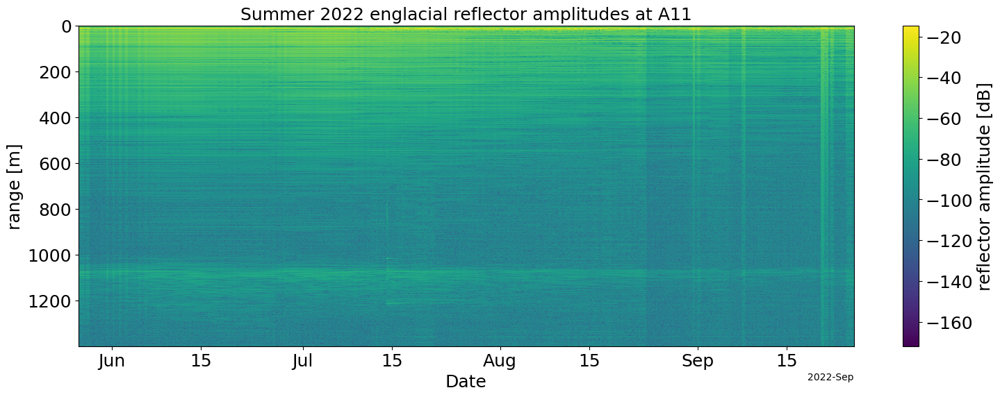

In [9]:
plot_profile(to_plot,'A11','Summer 2022')

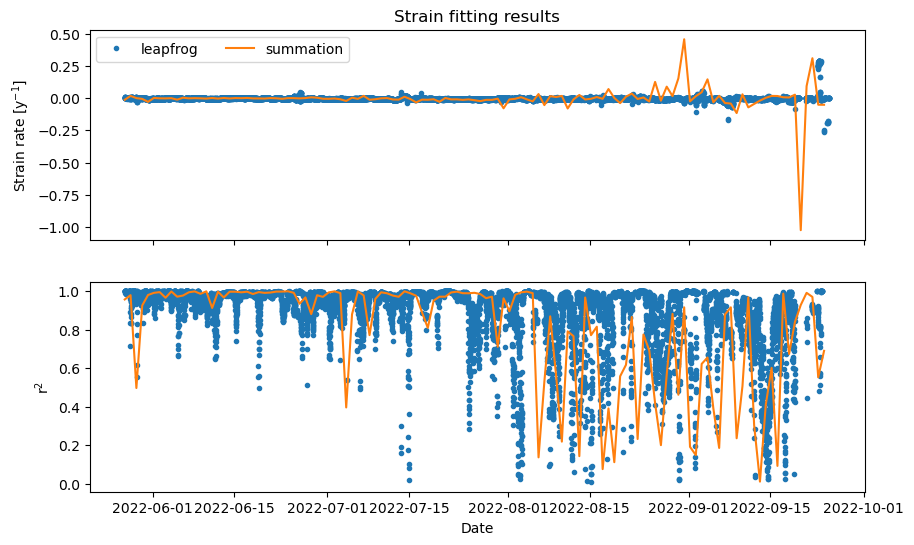

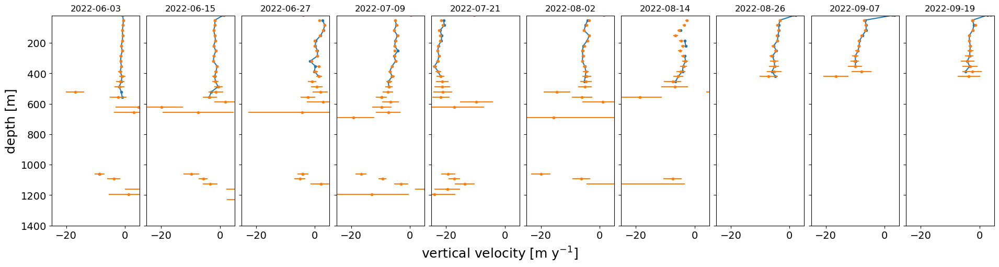

In [10]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,80,96,[-25,5])

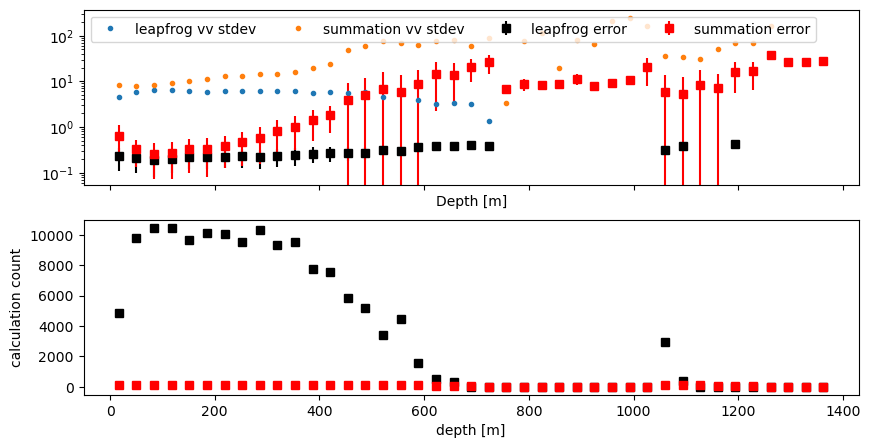

In [11]:
plot_error(vv,vv_err,vv_old,vv_old_err)

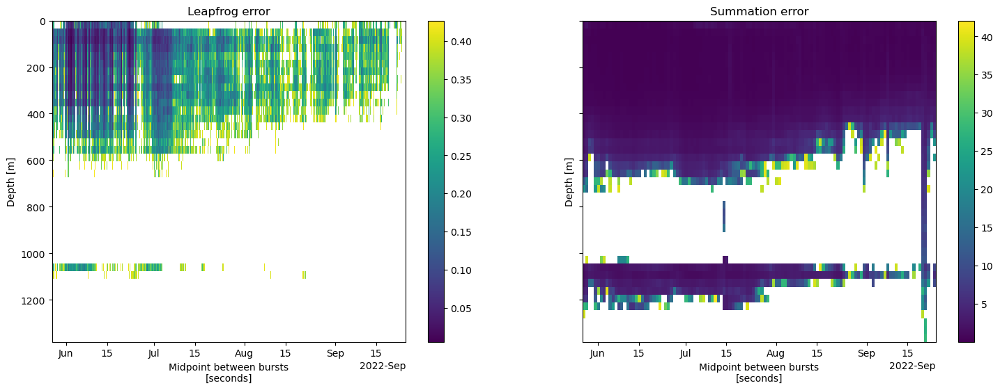

In [12]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


### Winter 2022-2023

In [13]:
to_plot = ds_101_w.profile_stacked.isel(attenuator_setting_pair=0).compute()


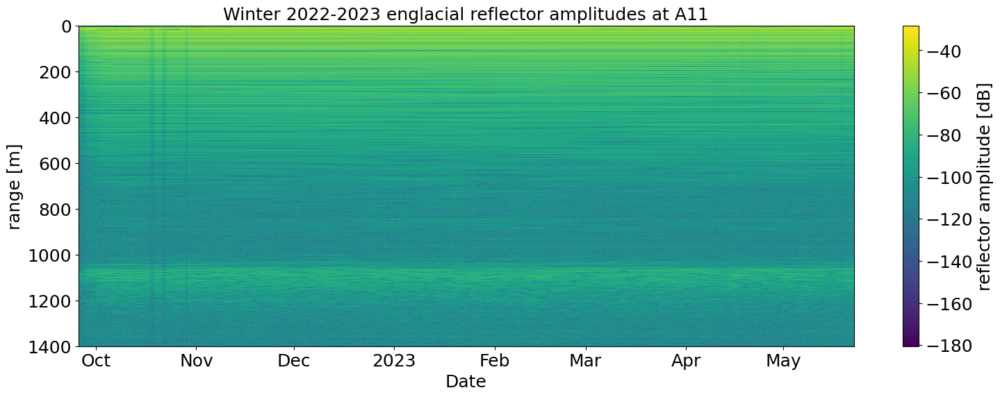

In [14]:
plot_profile(to_plot,'A11','Winter 2022-2023')

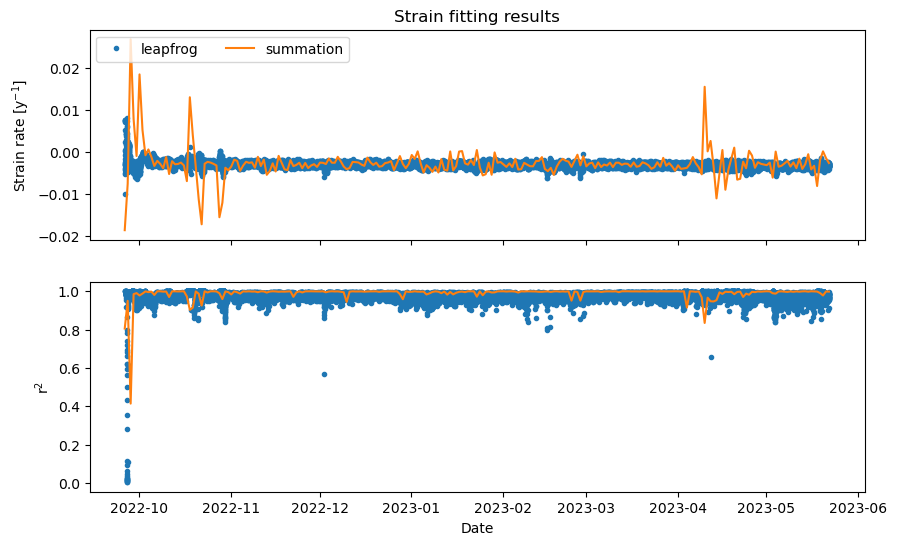

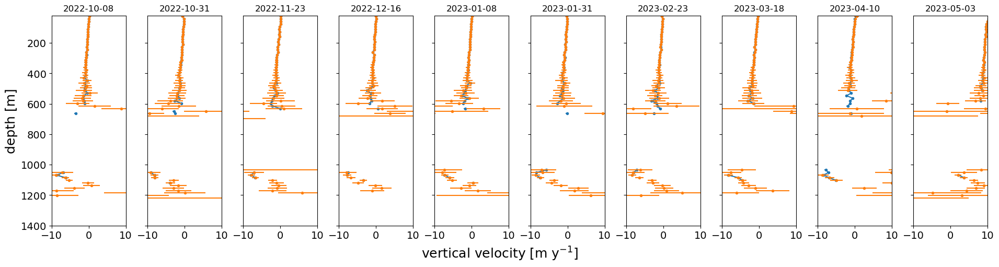

In [15]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,80,96,[-10,10])

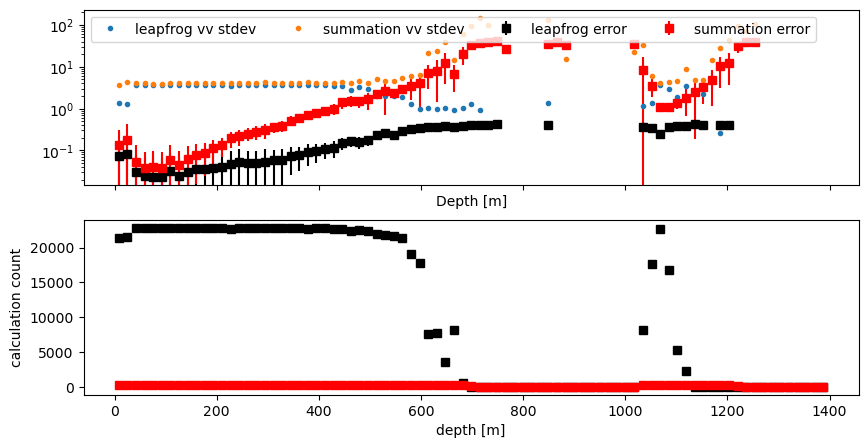

In [16]:
plot_error(vv,vv_err,vv_old,vv_old_err)

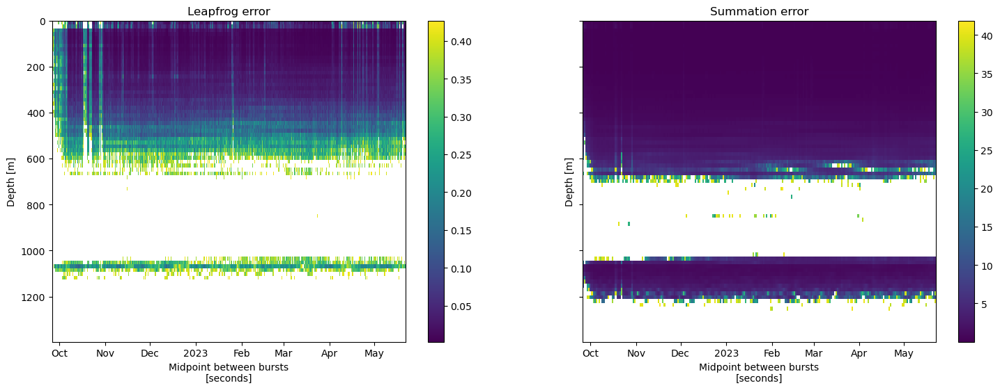

In [17]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


### No Summer 2023 data

## Station A13

### Summer 2022

In [18]:
to_plot  = custom_stacked_profile_series(ds_103.chirp.isel(attenuator_setting_pair=0),2,3e8,4e8)


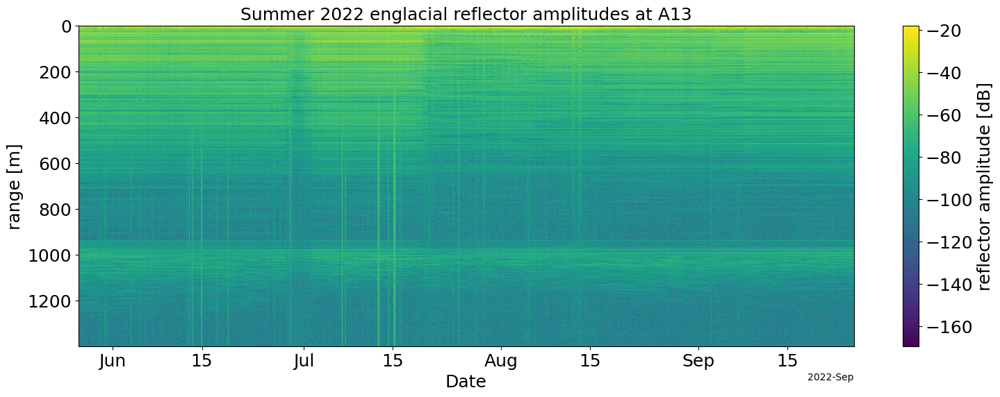

In [19]:
plot_profile(to_plot,'A13','Summer 2022')

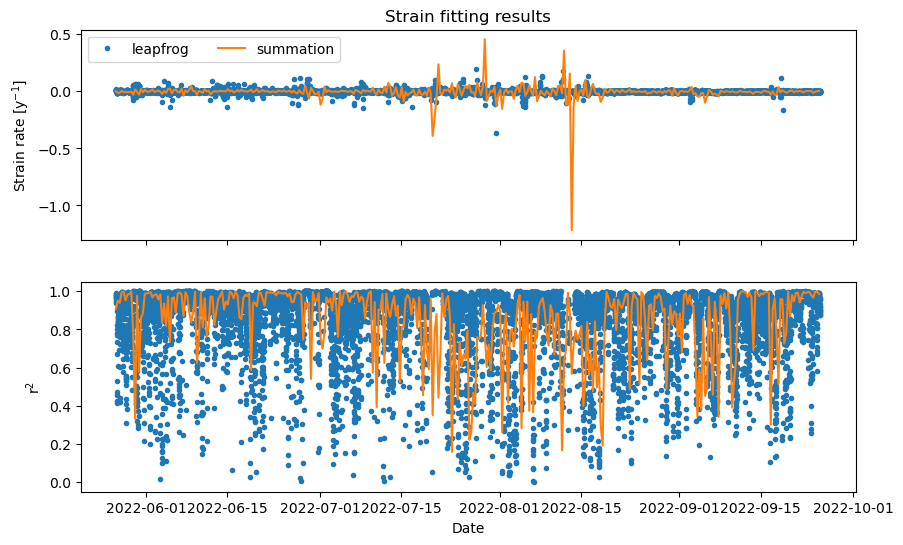

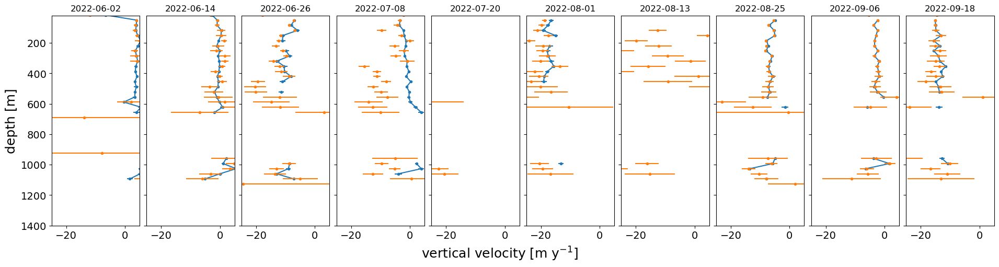

In [20]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,80,32,[-25,5]) # 8 hour window

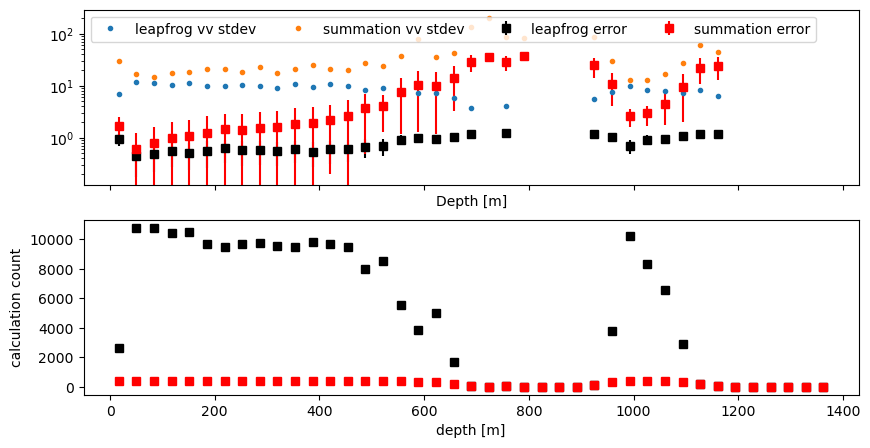

In [21]:
plot_error(vv,vv_err,vv_old,vv_old_err)

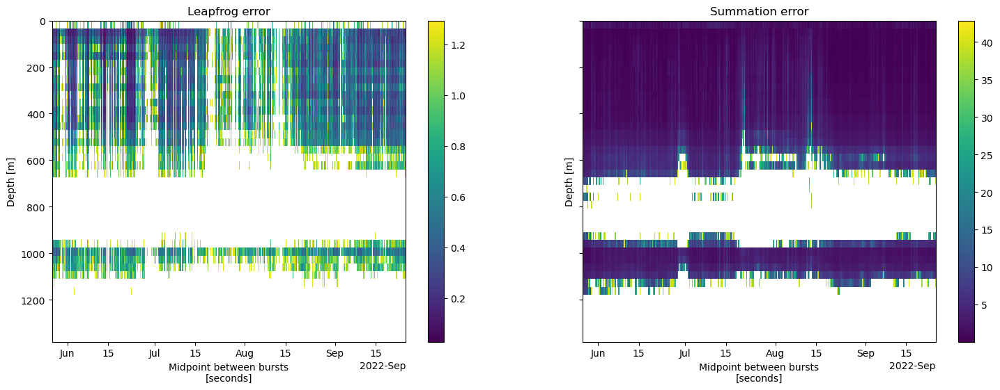

In [22]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


### Winter 2022-2023

In [23]:
to_plot = ds_103_w.profile_stacked.isel(attenuator_setting_pair=0).compute()


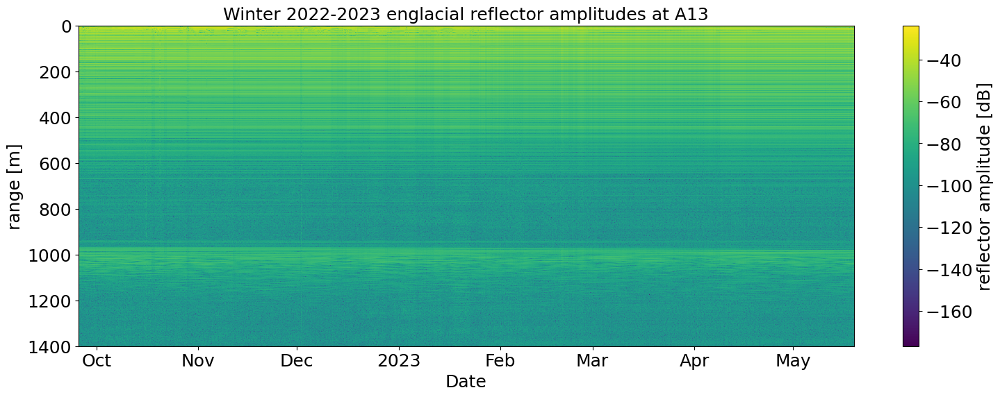

In [24]:
plot_profile(to_plot,'A13','Winter 2022-2023')

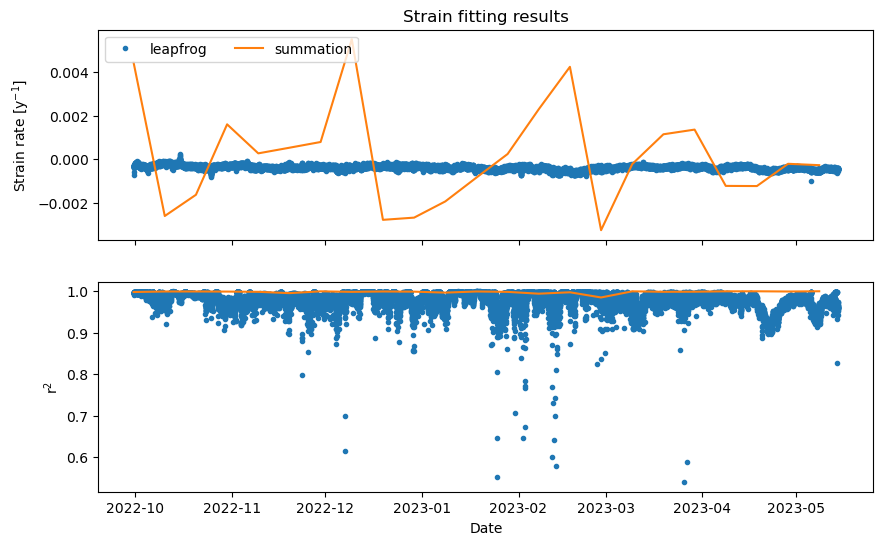

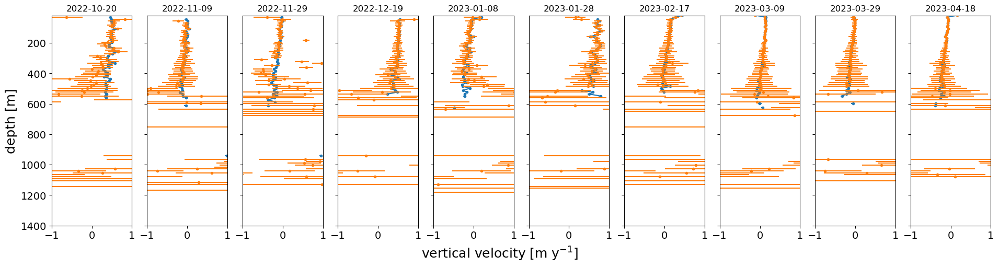

In [25]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,60,960,[-1,1]) # Best settings were 60, 1000 - 10 day window

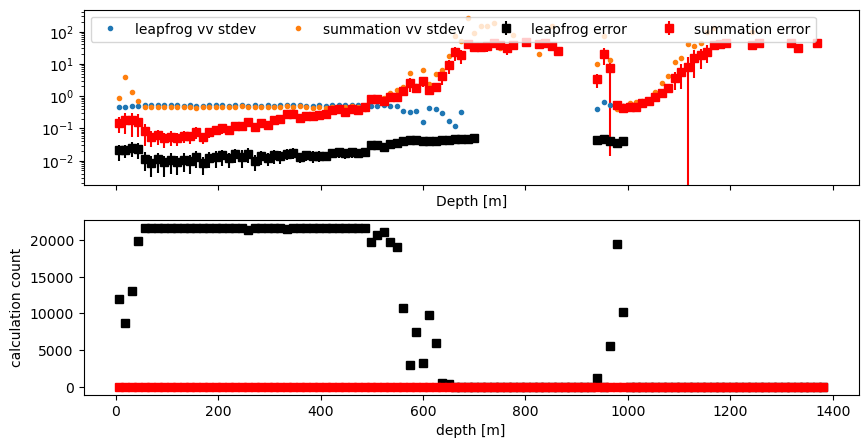

In [26]:
plot_error(vv,vv_err,vv_old,vv_old_err)

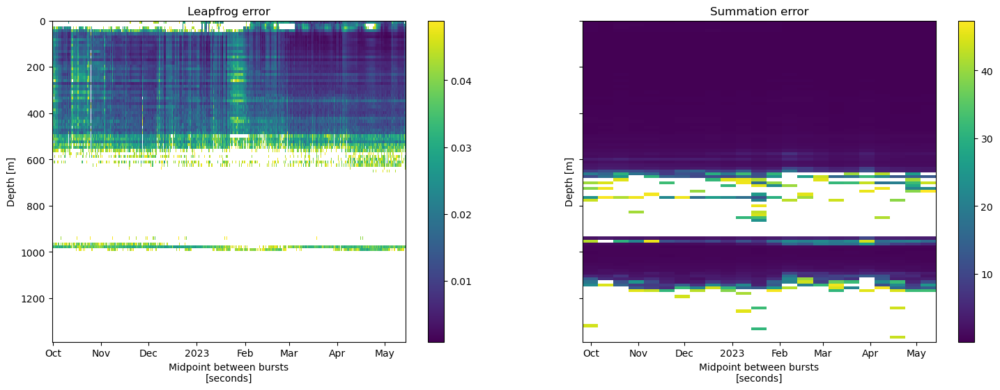

In [27]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


### Summer 2023

In [28]:
to_plot  = custom_stacked_profile_series(ds_103_s.chirp.isel(attenuator_setting_pair=2),2,3e8,4e8)


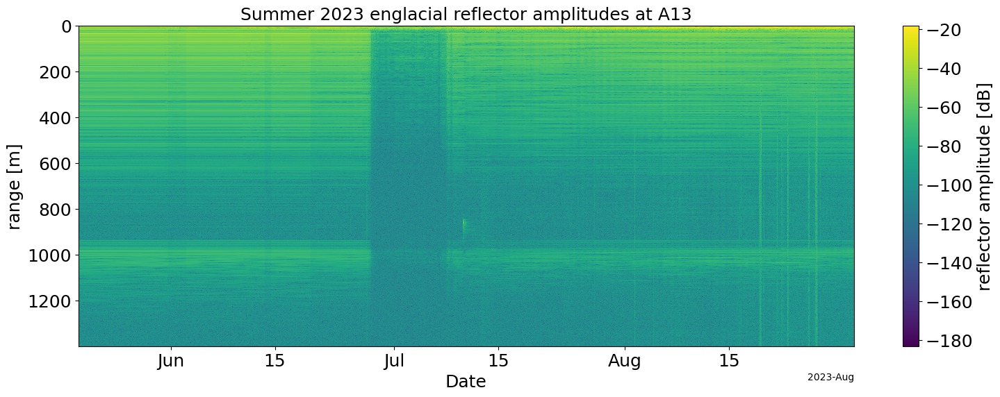

In [29]:
plot_profile(to_plot,'A13','Summer 2023')

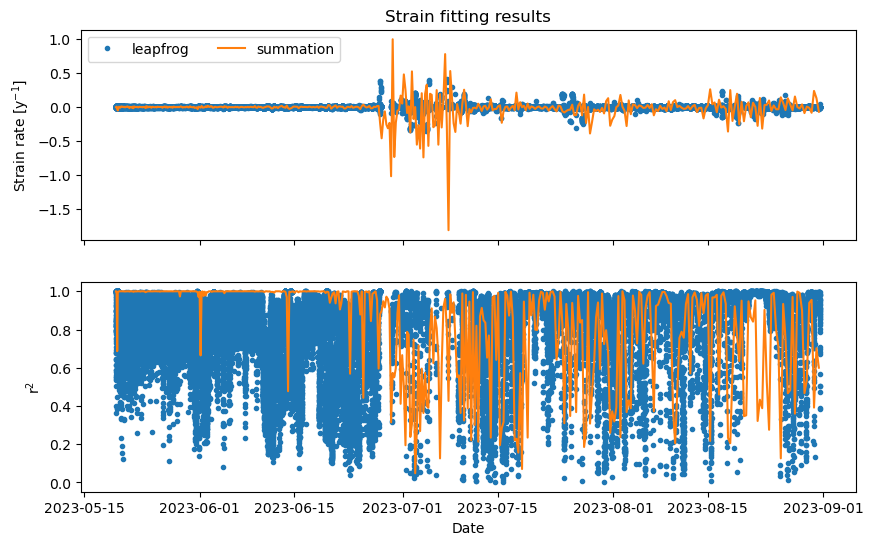

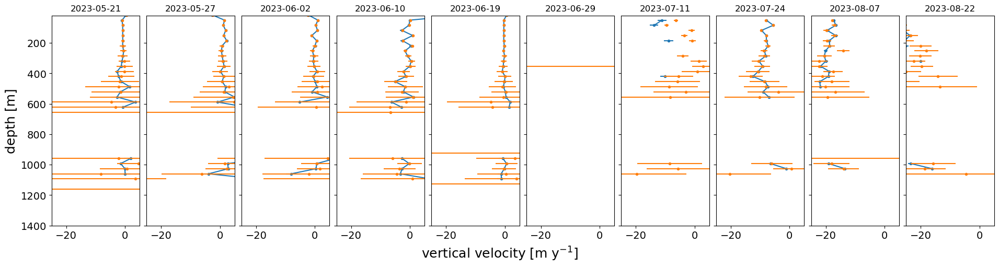

In [30]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,80,100,[-25,5]) # here the length of window is inaccurate. Might need to interpolate profiles first

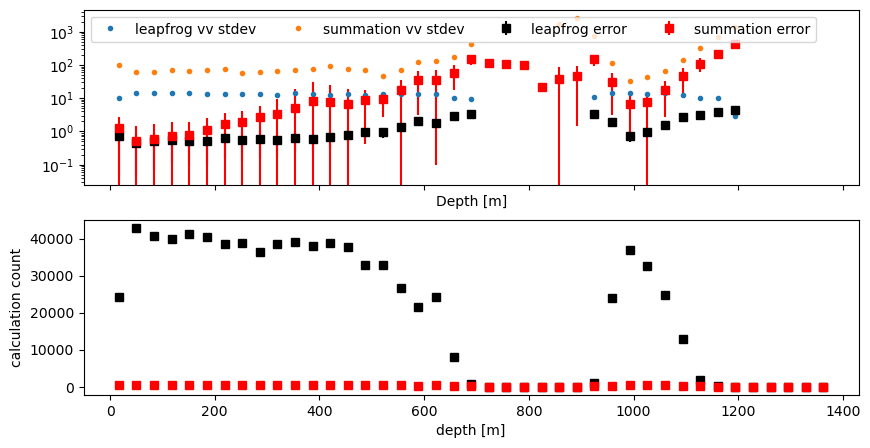

In [31]:
plot_error(vv,vv_err,vv_old,vv_old_err)

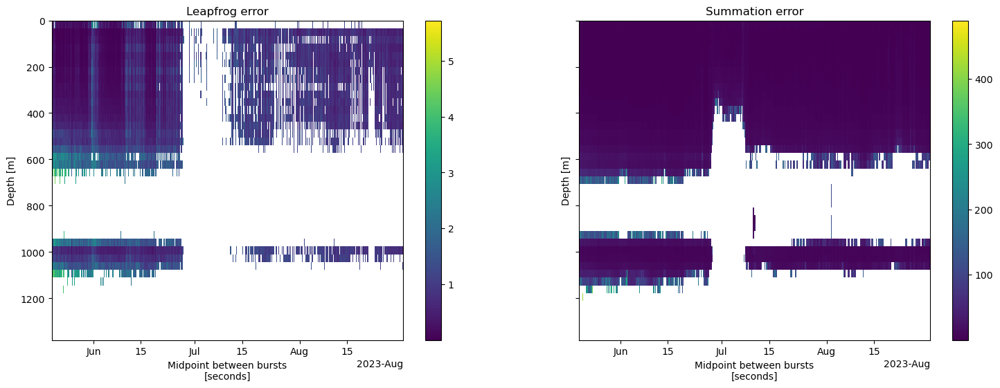

In [32]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


## Station A14

### Summer 2022

In [33]:
to_plot = ds_104.profile_stacked.isel(attenuator_setting_pair=0).compute()


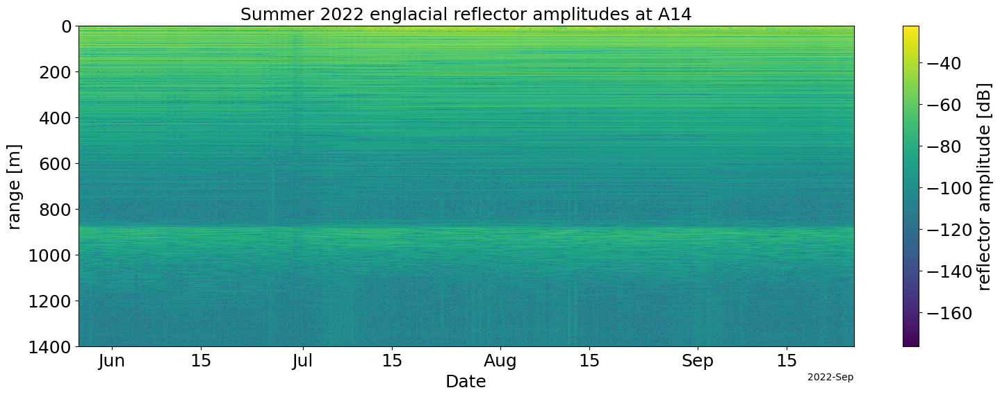

In [34]:
plot_profile(to_plot,'A14','Summer 2022')

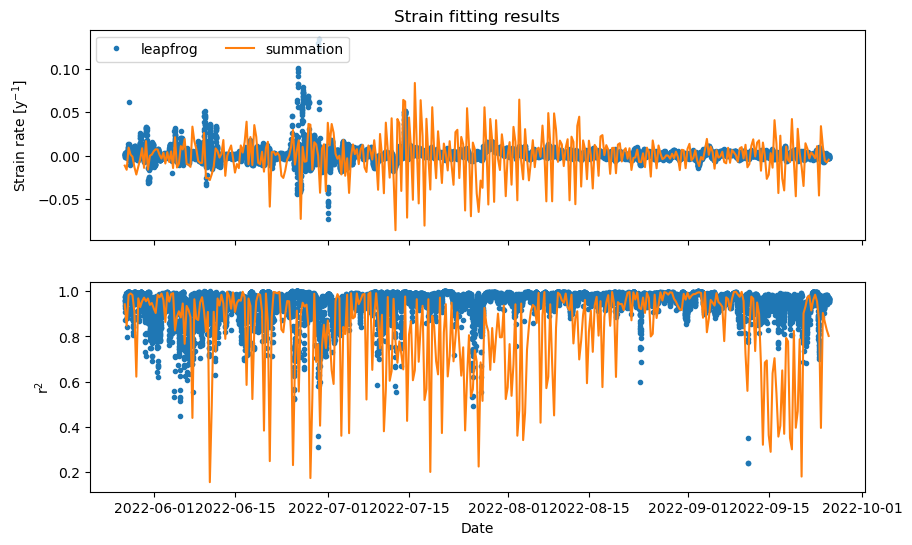

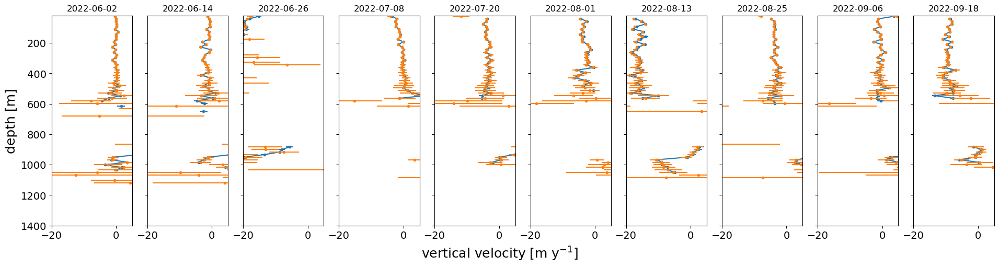

In [35]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,80,32,[-20,5]) # 8 hour window

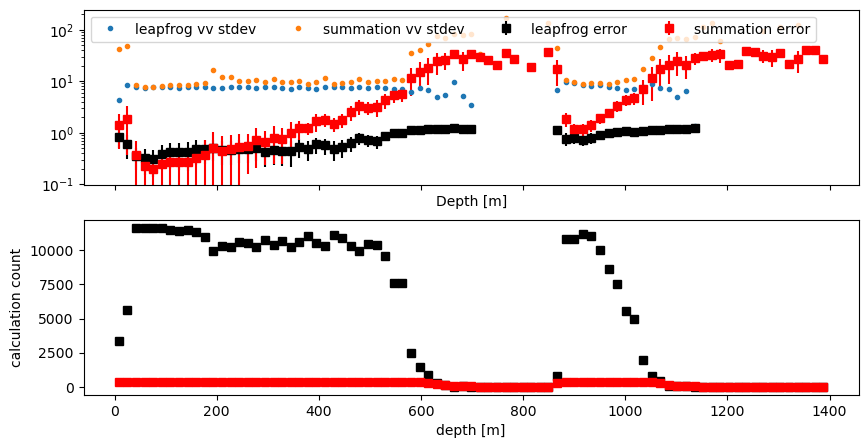

In [36]:
plot_error(vv,vv_err,vv_old,vv_old_err)

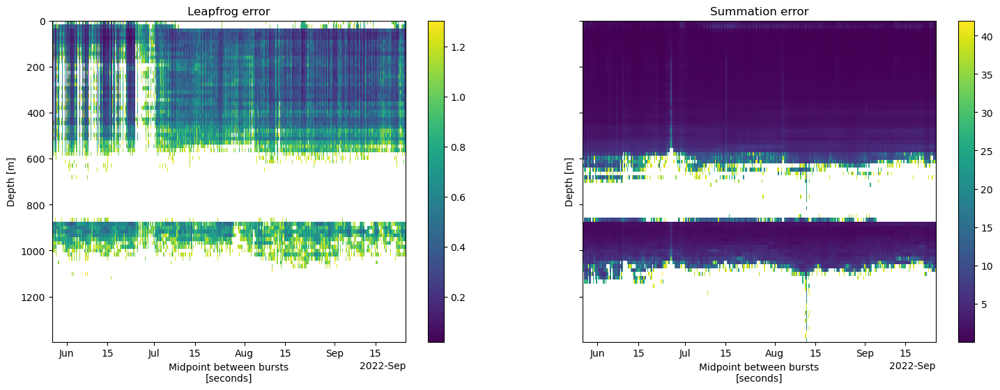

In [37]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


### Winter 2022-2023

In [38]:
to_plot = ds_104_w.profile_stacked.isel(attenuator_setting_pair=0).compute()


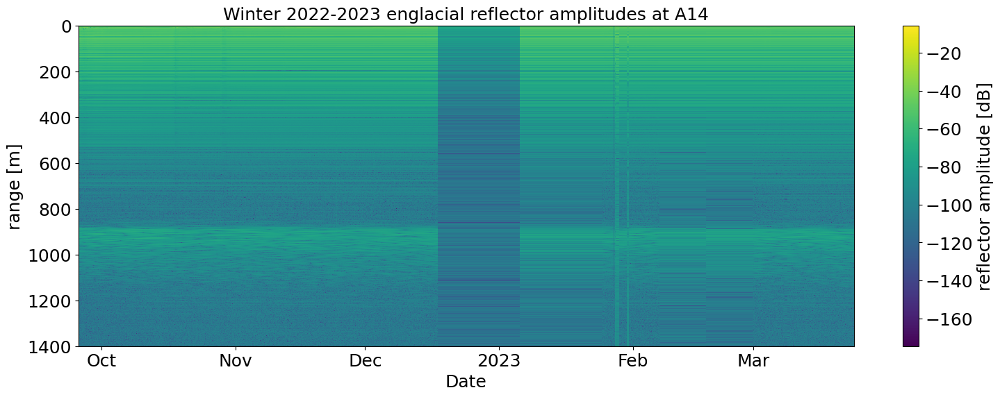

In [39]:
plot_profile(to_plot,'A14','Winter 2022-2023')

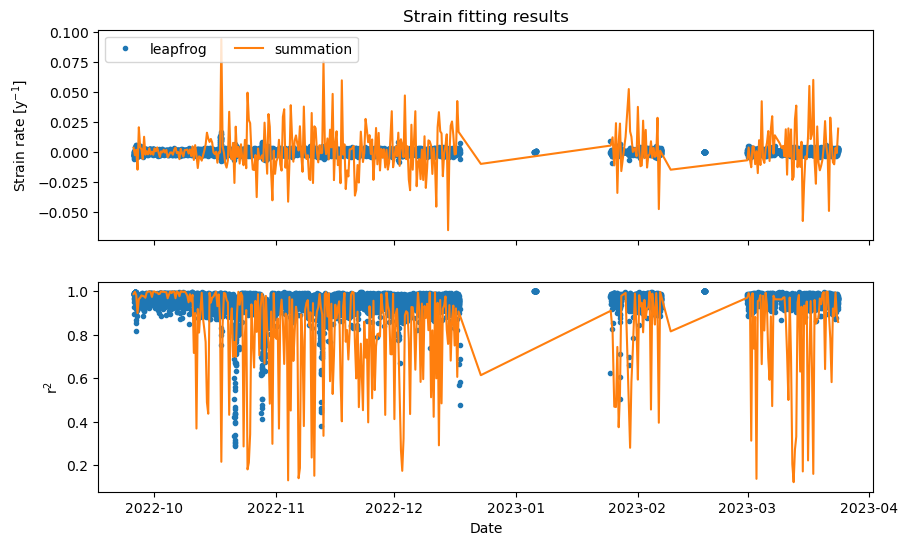

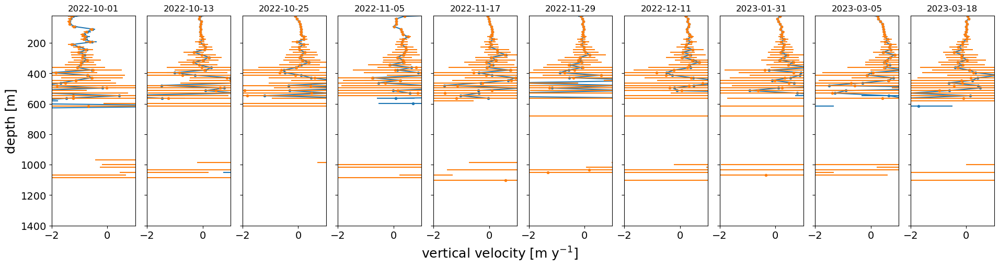

In [40]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,80,32,[-2,1]) # 8 hour window

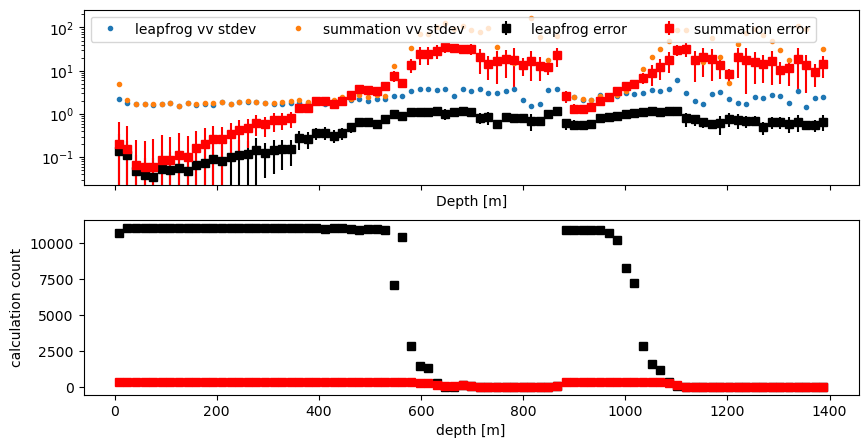

In [41]:
plot_error(vv,vv_err,vv_old,vv_old_err)

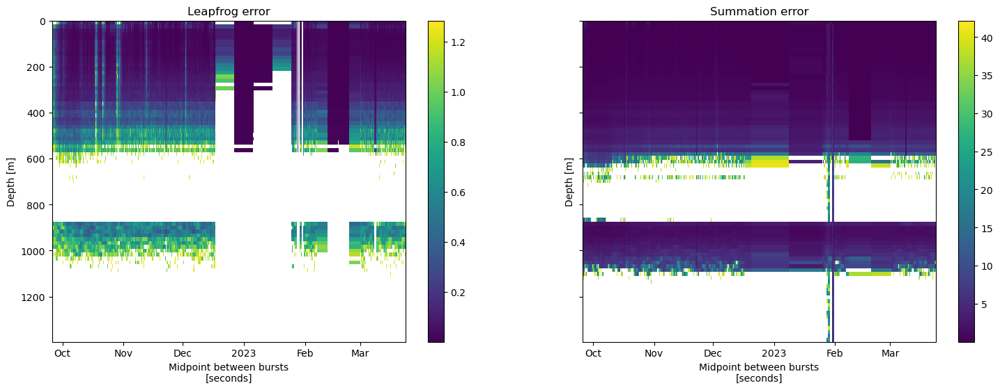

In [42]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


### Summer 2023

In [43]:
to_plot  = custom_stacked_profile_series(ds_104_s.chirp.isel(attenuator_setting_pair=0),2,3e8,4e8)


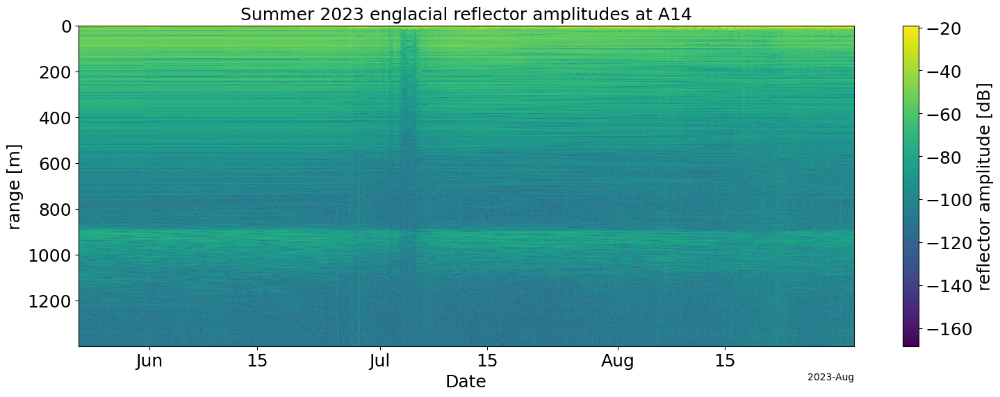

In [44]:
plot_profile(to_plot,'A14','Summer 2023')

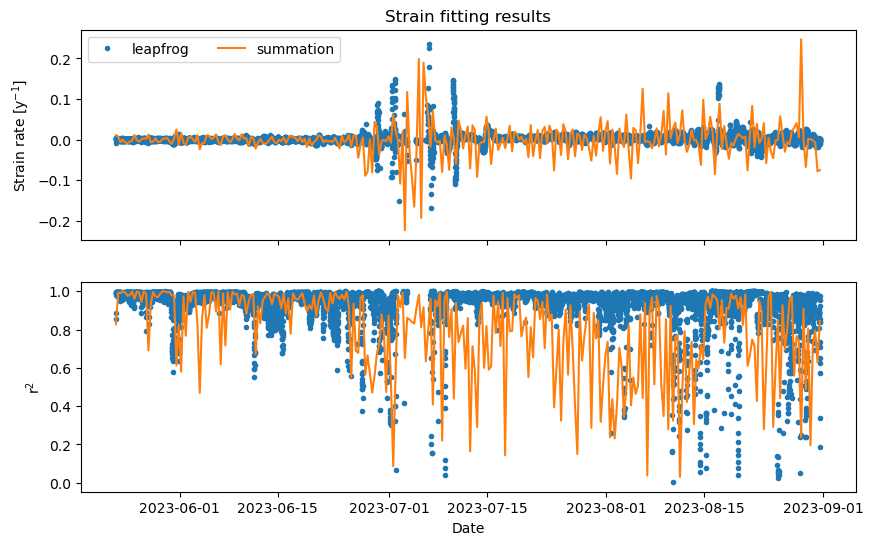

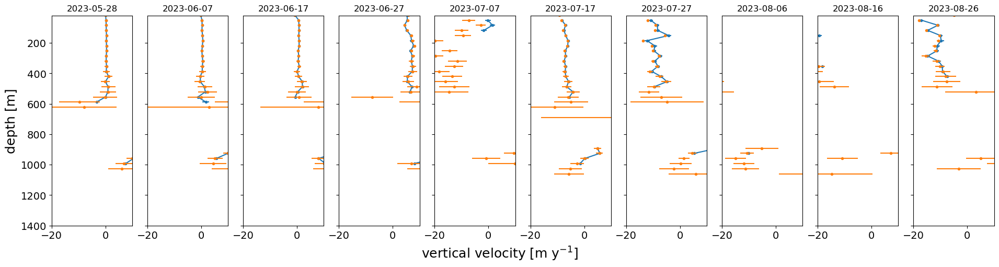

In [45]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,80,32,[-20,10]) # 8 hour window

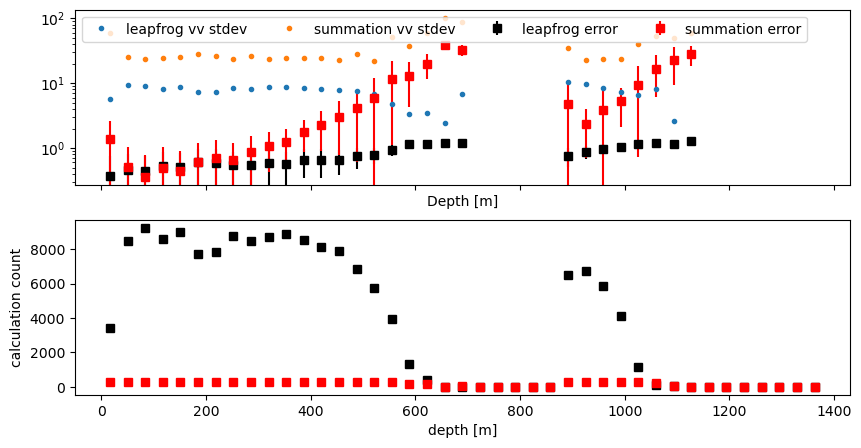

In [46]:
plot_error(vv,vv_err,vv_old,vv_old_err)

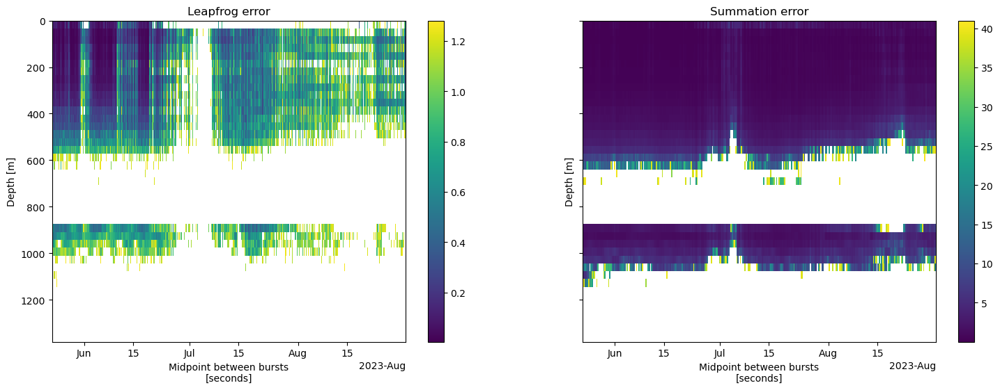

In [47]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


# Lake drainage

In [48]:
def generate_strain_fit_drainage(ds,window,lag,lims=None):
    # New method
    b1= ds.isel(time=range(0,len(ds)-lag))
    b2 = ds.isel(time=range(lag,len(ds)))
    ds_full, co_full, phi_full = xa.generate_range_diff(b1,b2,window,window,None,0,0.95)
    ds_full=ds_full.assign(coherence=(['time','profile_range'],co_full))
    ds_new = ds_full.where(abs(ds_full.coherence) > 0.95).drop_duplicates('time')

    vv = ds_new.range_diff / ds_new.time_diff * 31536000
    vv_err = ds_new.err / ds_new.time_diff * 31536000
    fit=vv.where(vv.profile_range <=600).polyfit('profile_range',1,full=True)
    r2 = 1-fit.polyfit_residuals/((vv-vv.mean())**2).sum(dim='profile_range')
    
    # Old Method
    b1= ds.isel(time=range(0,len(ds)-1))
    b2 = ds.isel(time=range(1,len(ds)))
    ds_full, co_full, phi_full = xa.generate_range_diff(b1,b2,window,window,None,0,0.95)
    ds_full=ds_full.assign(coherence=(['time','profile_range'],co_full))
    ds_old = ds_full.where(abs(ds_full.coherence) > 0.95).drop_duplicates('time')
    vv_old = ds_old.range_diff.coarsen(time=lag,boundary='trim').sum()/ds_old.time_diff.coarsen(time=lag,boundary='trim').sum()*31536000
    vv_old_err = np.sqrt(((ds_old.err)**2).coarsen(time=lag,boundary='trim').sum())/ds_old.time_diff.coarsen(time=lag,boundary='trim').sum()*31536000
    fit_old=vv_old.where(vv_old.profile_range <=600).polyfit('profile_range',1,full=True)
    r2_old = 1-fit_old.polyfit_residuals/((vv_old-vv_old.mean())**2).sum(dim='profile_range')
    
    # Plotting
    fig, axs = plt.subplots(nrows=2,figsize=(10,6),sharex=True)
    axs[0].plot(fit.time.values,fit.polyfit_coefficients.sel(degree=1).values,linestyle='None',marker='.',label='leapfrog')
    axs[0].plot(fit_old.time.values,fit_old.polyfit_coefficients.sel(degree=1).values,label='summation')
    #axs[0].set_ylim([-1e-2,1e-2])
    axs[0].set_ylabel('Strain rate [y$^{-1}$]')
    axs[0].set_title('Strain fitting results')
    axs[0].legend(loc="upper left", ncol=2)
    axs[1].plot(fit.time.values,r2.values,linestyle='None',marker='.')
    axs[1].plot(fit_old.time.values,r2_old.values)
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('r$^2$')
    
    fig1, axs_1 = plt.subplots(ncols=6,figsize=(19,5),sharey=True,layout='constrained')
    #fig1.suptitle('Strain fitting (\u03B5\u0307 in 10$^{-3}$ yr$^{-1}$)',fontsize=18)
    vv_times = np.arange(math.ceil(0.3*len(vv_old.time)),math.ceil(0.9*len(vv_old.time)),math.ceil(0.6*len(vv_old.time))//6)
    for i in range(6):
        time = vv_old.time.isel(time = vv_times[i]).values
        axs_1[i].errorbar(vv.sel(time = time,method="nearest") ,vv.profile_range,yerr=None,xerr=vv_err.sel(time = time,method="nearest"),marker='.',zorder=1)
        axs_1[i].errorbar(vv_old.sel(time = time,method="nearest") ,vv_old.profile_range,yerr=None,xerr=vv_old_err.sel(time = time,method="nearest"),linestyle='',marker='.',zorder=2)
        #slope = fit.polyfit_coefficients.sel(degree=1).isel(time=vv_times[i]).values*np.linspace(20,600)+fit.polyfit_coefficients.sel(degree=0).isel(time=vv_times[i]).values

        #axs_1[i].plot(slope,np.linspace(20,600),color='r',zorder=2)
        unit = ''#'x10$^{-3}$ yr$^{-1}$'
        #axs_1[plt_count].text(-10,300, f"\u03B5\u0307= {fit.polyfit_coefficients.sel(degree=1).isel(time=i).values*1000:.2g}"+unit,color = 'r',fontsize=14)
        axs_1[i].set_title(f'{time.astype(str)[:16]}'.replace('T',' '))
        if lims:
            axs_1[i].set_xlim(lims)
        axs_1[i].set_ylim([20,1400])
        axs_1[i].tick_params(axis='both', which='major', labelsize=14)


    axs_1[0].invert_yaxis()

    axs_1[0].set_ylabel('depth [m]',fontsize=18)
    fig1.supxlabel('vertical velocity [m y$^{-1}$]',fontsize=18)
    return vv,vv_err,vv_old,vv_old_err

## A11

In [49]:
to_plot  = custom_stacked_profile_series(ds_101.chirp.isel(attenuator_setting_pair=1,time=range(4400,4900)),2,3e8,4e8)


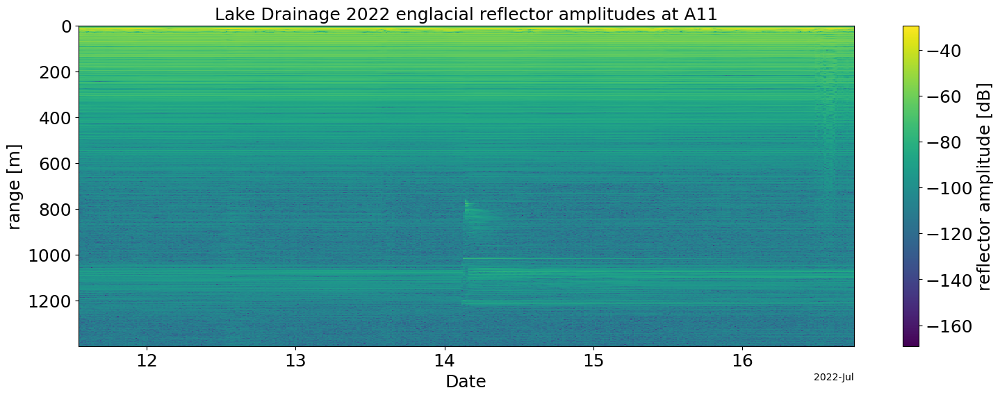

In [50]:
plot_profile(to_plot,'A11','Lake Drainage 2022')

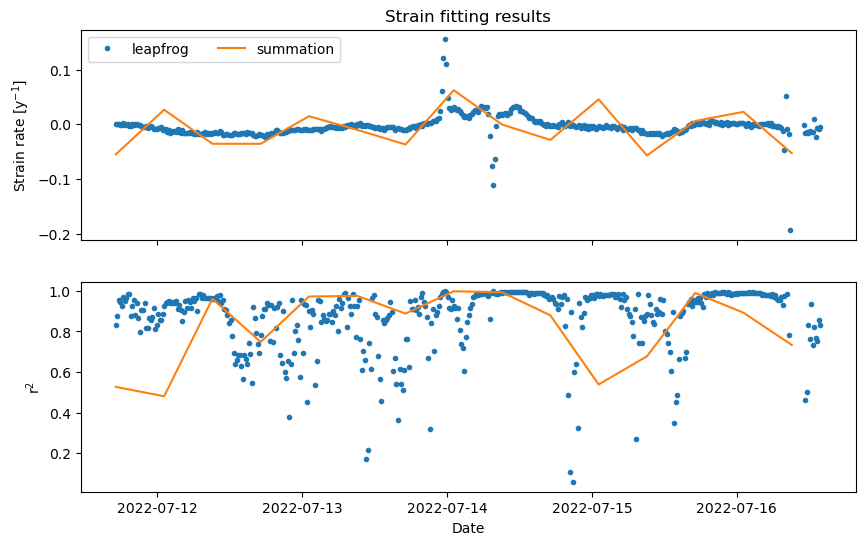

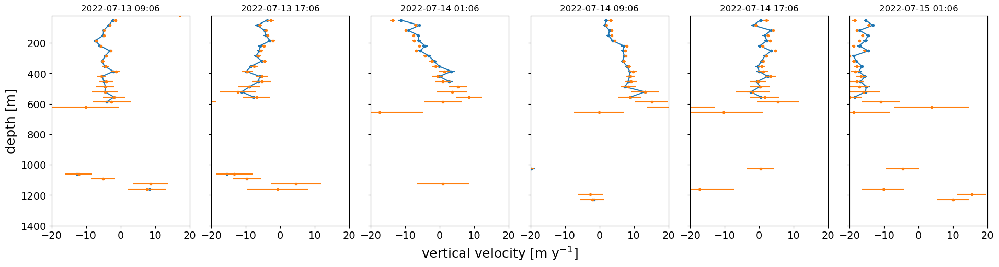

In [51]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit_drainage(to_plot,80,32,[-20,20]) # ~8 hour window
#plot_error(vv,vv_err,vv_old,vv_old_err)

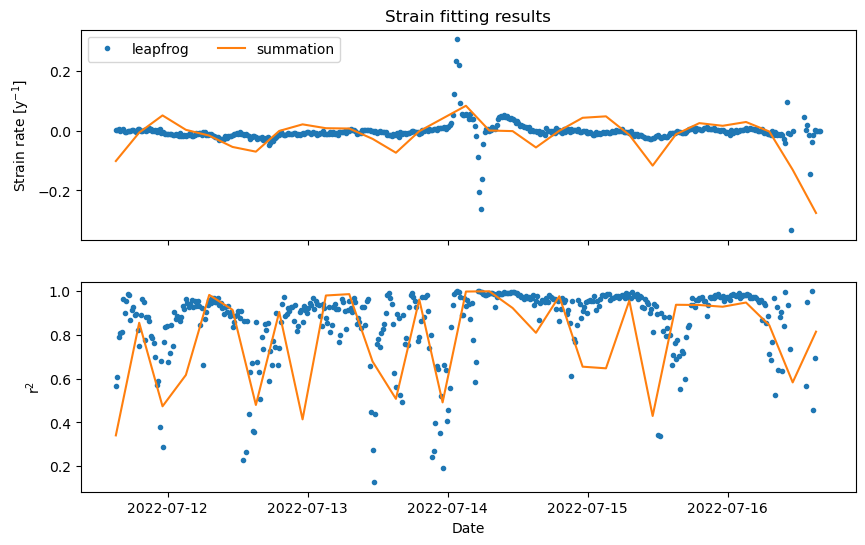

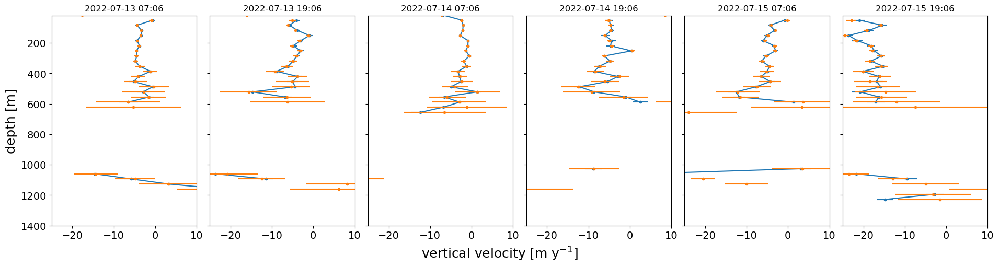

In [52]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit_drainage(to_plot,80,16,[-25,10]) # ~4 hour window

(<xarray.DataArray (time: 492, profile_range: 41)>
 array([[         nan, -22.62982956, -27.6325949 , ...,          nan,
                  nan,          nan],
        [         nan, -20.76508441, -25.98270843, ...,          nan,
                  nan,          nan],
        [         nan,  -7.90520344, -13.09098959, ...,          nan,
                  nan,          nan],
        ...,
        [ 18.3203512 ,  -8.3627891 ,  -5.99143373, ...,          nan,
                  nan,          nan],
        [         nan, -12.96107868,  -8.36098348, ...,          nan,
                  nan,          nan],
        [ 19.84059232, -10.61256271, -12.05402115, ...,          nan,
                  nan,          nan]])
 Coordinates:
   * time           (time) datetime64[ns] 2022-07-11T14:07:08.500000 ... 2022-...
   * profile_range  (profile_range) float64 16.82 50.47 ... 1.329e+03 1.363e+03,
 <xarray.DataArray (time: 492, profile_range: 41)>
 array([[       nan, 2.00003179, 1.66512182, ...,        na

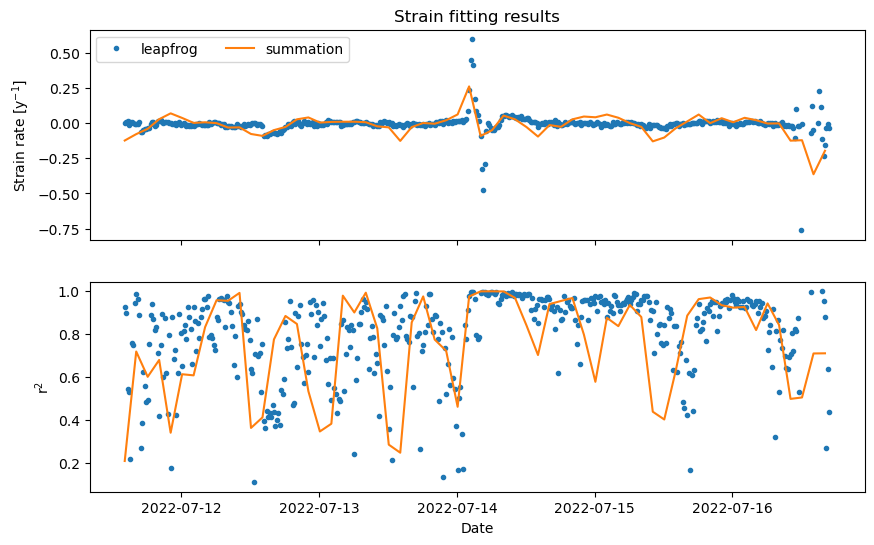

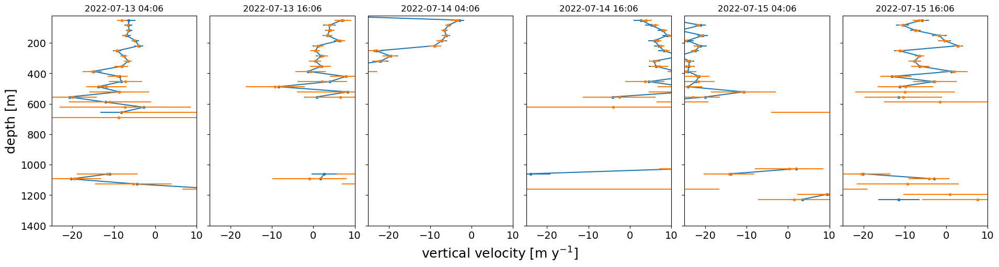

In [53]:
generate_strain_fit_drainage(to_plot,80,8,[-25,10]) # ~2 hour window

(<xarray.DataArray (time: 496, profile_range: 41)>
 array([[         nan,  -6.2478666 , -18.71651829, ...,          nan,
                  nan,          nan],
        [         nan, -22.85897211, -34.10829138, ...,          nan,
                  nan,          nan],
        [         nan,  -8.00229443, -17.52291003, ...,          nan,
                  nan,          nan],
        ...,
        [ 20.77344823, -10.73877489, -10.76938656, ...,          nan,
                  nan,          nan],
        [ 22.43848977,  -1.7815749 ,  -8.60174647, ...,          nan,
                  nan,          nan],
        [ 18.16584318,  -0.232906  , -11.99101946, ...,          nan,
                  nan,          nan]])
 Coordinates:
   * time           (time) datetime64[ns] 2022-07-11T13:37:03.500000 ... 2022-...
   * profile_range  (profile_range) float64 16.82 50.47 ... 1.329e+03 1.363e+03,
 <xarray.DataArray (time: 496, profile_range: 41)>
 array([[       nan, 3.29380692, 2.67246066, ...,        na

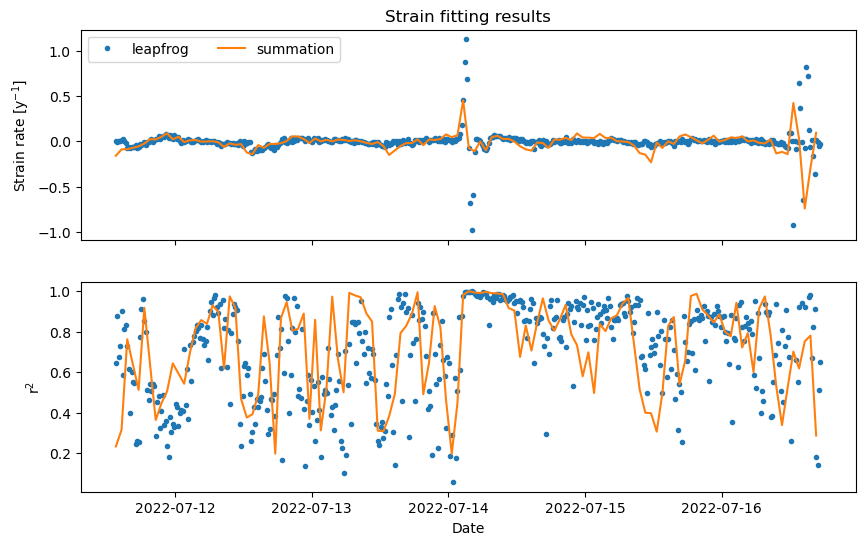

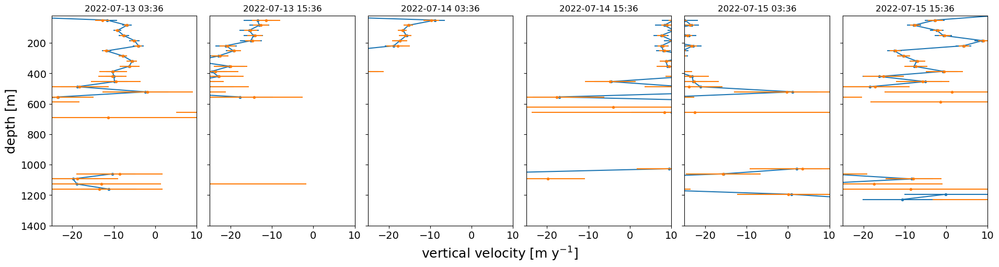

In [54]:
generate_strain_fit_drainage(to_plot,80,4,[-25,10]) # ~1 hour window

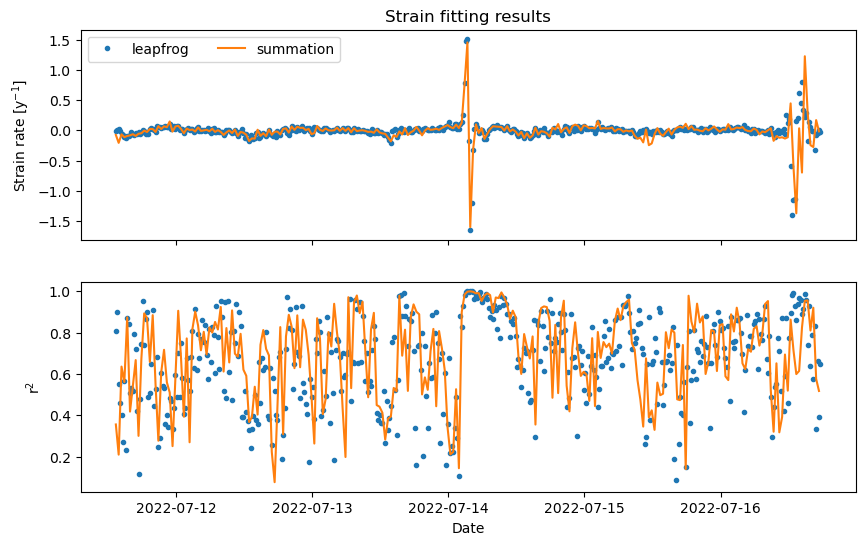

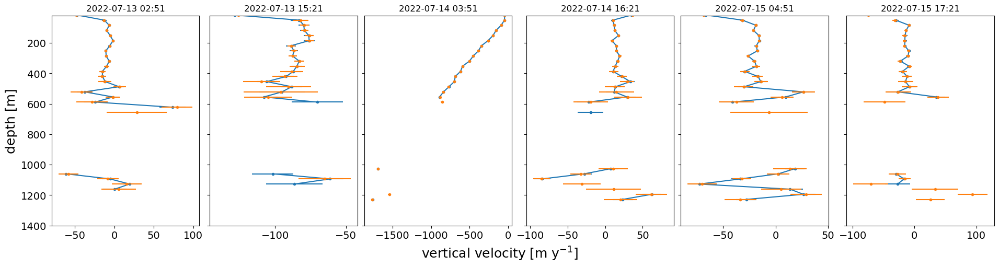

In [55]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit_drainage(to_plot,80,2) # ~30 minute window

## A13

In [56]:
to_plot  = custom_stacked_profile_series(ds_103.chirp.isel(attenuator_setting_pair=1,time=range(4400,4900)),2,3e8,4e8)


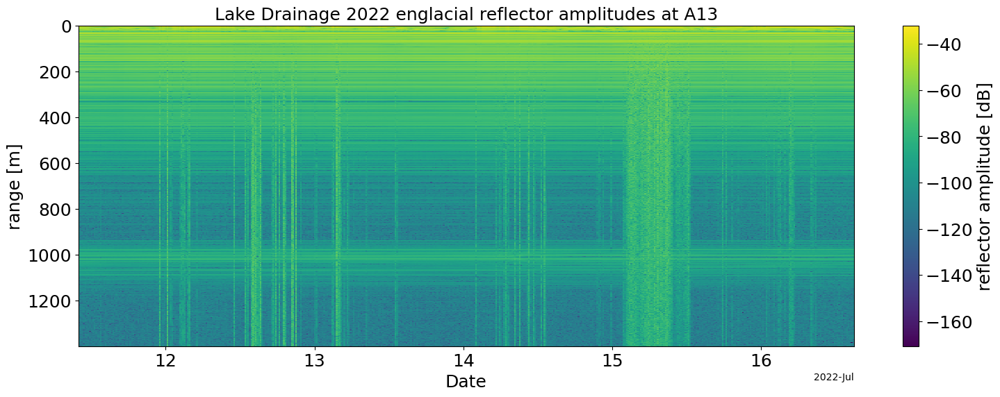

In [57]:
plot_profile(to_plot,'A13','Lake Drainage 2022')

(<xarray.DataArray (time: 468, profile_range: 41)>
 array([[       nan, 1.76538093, 1.53840286, ...,        nan,        nan,
                nan],
        [       nan, 1.41369821, 1.24299465, ...,        nan,        nan,
                nan],
        [       nan, 1.55346845, 1.5016626 , ...,        nan,        nan,
                nan],
        ...,
        [       nan, 6.12143522, 6.56326236, ...,        nan,        nan,
                nan],
        [       nan, 6.31754586, 6.68294236, ...,        nan,        nan,
                nan],
        [       nan, 6.54497027, 6.79093833, ...,        nan,        nan,
                nan]])
 Coordinates:
   * time           (time) datetime64[ns] 2022-07-11T14:03:55.500000 ... 2022-...
   * profile_range  (profile_range) float64 16.82 50.47 ... 1.329e+03 1.363e+03,
 <xarray.DataArray (time: 468, profile_range: 41)>
 array([[       nan, 0.2708916 , 0.39645564, ...,        nan,        nan,
                nan],
        [       nan, 0.24545904, 0.

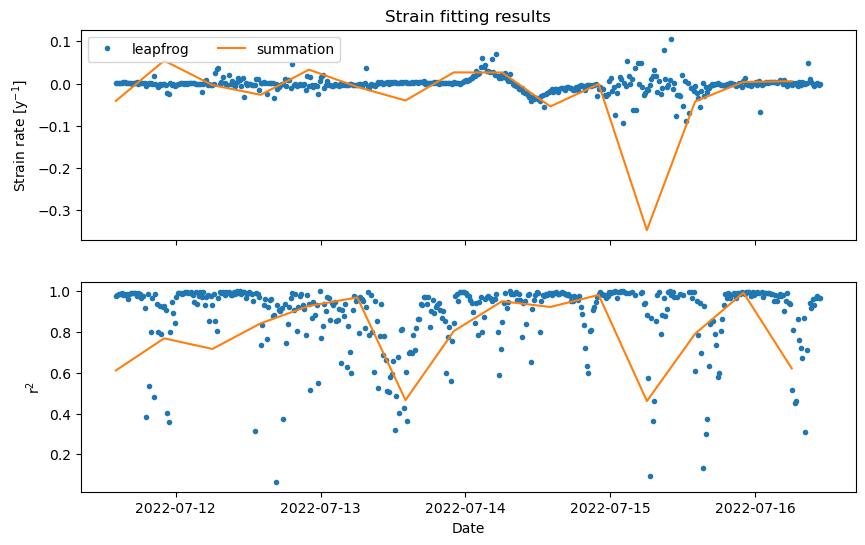

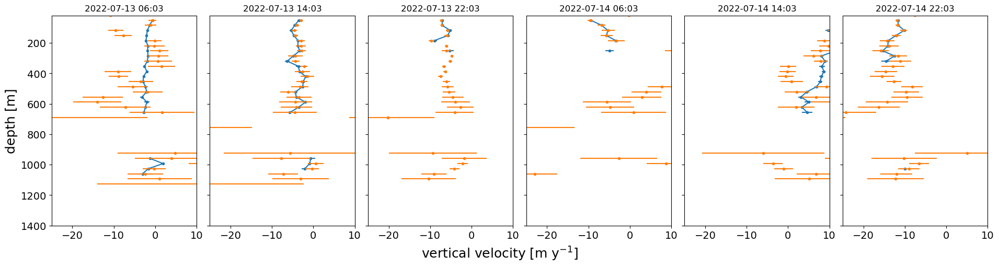

In [58]:
generate_strain_fit_drainage(to_plot,80,32,[-25,10]) # ~8 hour window

(<xarray.DataArray (time: 484, profile_range: 41)>
 array([[       nan, 4.25495905, 6.17658712, ...,        nan,        nan,
                nan],
        [       nan, 4.12970934, 5.88584276, ...,        nan,        nan,
                nan],
        [       nan, 2.29035317, 4.10755246, ...,        nan,        nan,
                nan],
        ...,
        [       nan, 7.48373501, 6.70330462, ...,        nan,        nan,
                nan],
        [       nan, 7.30305767, 6.27172956, ...,        nan,        nan,
                nan],
        [       nan, 6.81554278, 5.84928681, ...,        nan,        nan,
                nan]])
 Coordinates:
   * time           (time) datetime64[ns] 2022-07-11T12:04:07.500000 ... 2022-...
   * profile_range  (profile_range) float64 16.82 50.47 ... 1.329e+03 1.363e+03,
 <xarray.DataArray (time: 484, profile_range: 41)>
 array([[       nan, 0.42201495, 0.65081358, ...,        nan,        nan,
                nan],
        [       nan, 0.41165589, 0.

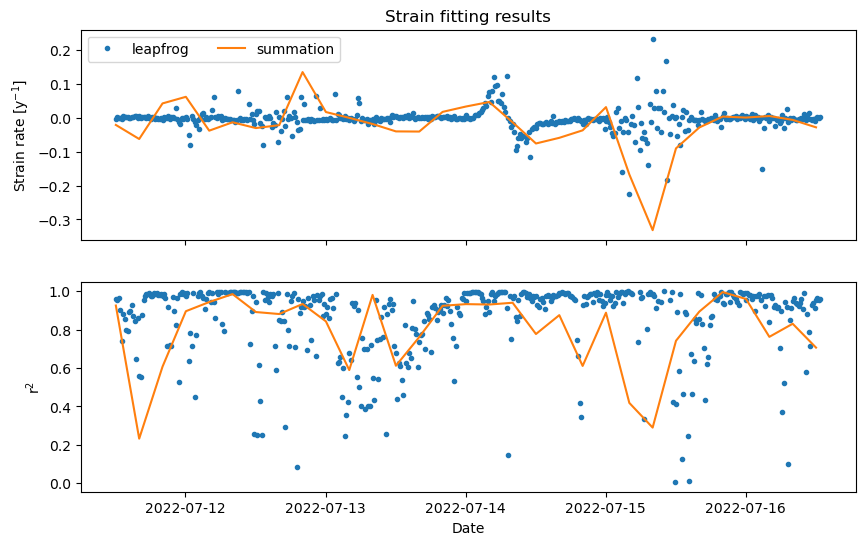

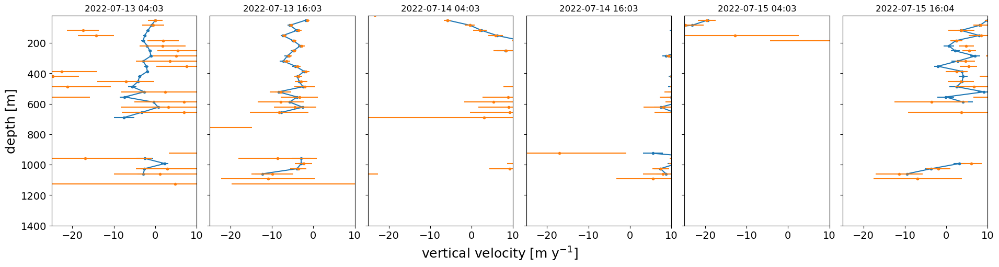

In [59]:
generate_strain_fit_drainage(to_plot,80,16,[-25,10]) # ~4 hour window

(<xarray.DataArray (time: 492, profile_range: 41)>
 array([[        nan, 15.20180796, 16.53355264, ...,         nan,
                 nan,         nan],
        [        nan, 14.33871401, 15.61941907, ...,         nan,
                 nan,         nan],
        [        nan, 10.73453158, 12.19126311, ...,         nan,
                 nan,         nan],
        ...,
        [        nan, 20.69581376, 25.4469417 , ...,         nan,
                 nan,         nan],
        [        nan, 14.61221342, 19.14699522, ...,         nan,
                 nan,         nan],
        [        nan, 15.39657747, 18.93514028, ...,         nan,
                 nan,         nan]])
 Coordinates:
   * time           (time) datetime64[ns] 2022-07-11T11:03:51.500000 ... 2022-...
   * profile_range  (profile_range) float64 16.82 50.47 ... 1.329e+03 1.363e+03,
 <xarray.DataArray (time: 492, profile_range: 41)>
 array([[       nan, 0.61880209, 0.75023762, ...,        nan,        nan,
                nan],

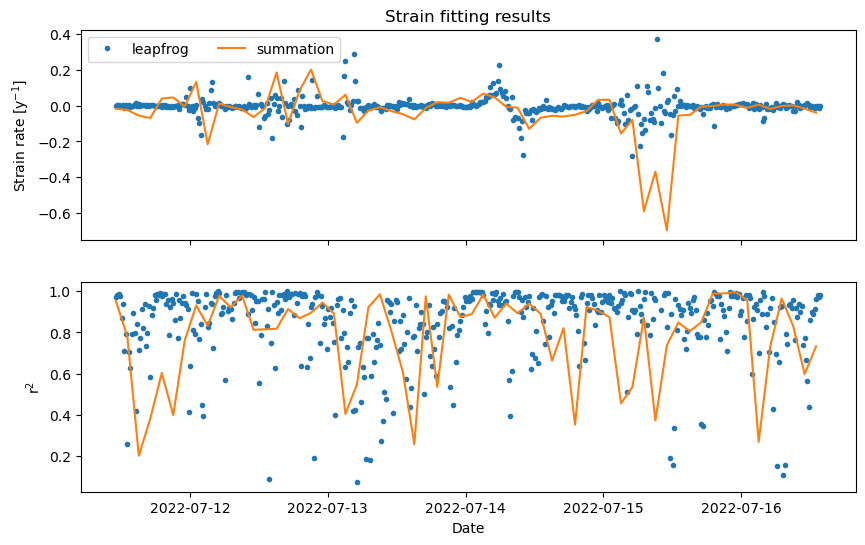

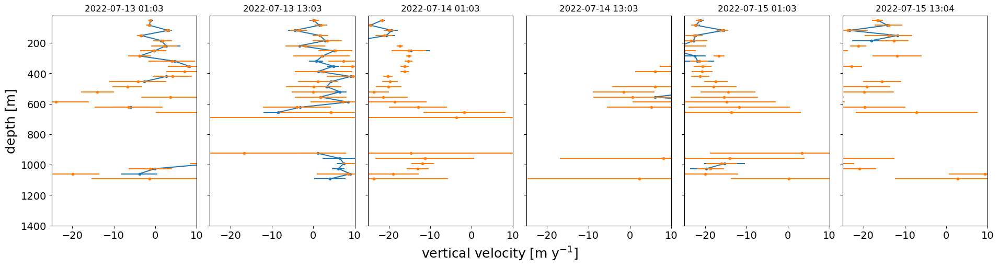

In [60]:
generate_strain_fit_drainage(to_plot,80,8,[-25,10]) # ~2 hour window

(<xarray.DataArray (time: 496, profile_range: 41)>
 array([[        nan, 22.10465428, 23.52390671, ...,         nan,
                 nan,         nan],
        [37.73718863, 10.82910567, 12.36979204, ...,         nan,
                 nan,         nan],
        [48.3156757 , 12.61119986, 15.81225573, ...,         nan,
                 nan,         nan],
        ...,
        [        nan,  7.88272741, 13.41062145, ...,         nan,
                 nan,         nan],
        [        nan,  4.20330839,  6.01753455, ...,         nan,
                 nan,         nan],
        [45.83709603,  3.36093723,  1.94094223, ...,         nan,
                 nan,         nan]])
 Coordinates:
   * time           (time) datetime64[ns] 2022-07-11T10:33:51 ... 2022-07-16T1...
   * profile_range  (profile_range) float64 16.82 50.47 ... 1.329e+03 1.363e+03,
 <xarray.DataArray (time: 496, profile_range: 41)>
 array([[       nan, 0.84139493, 0.72739148, ...,        nan,        nan,
                nan],

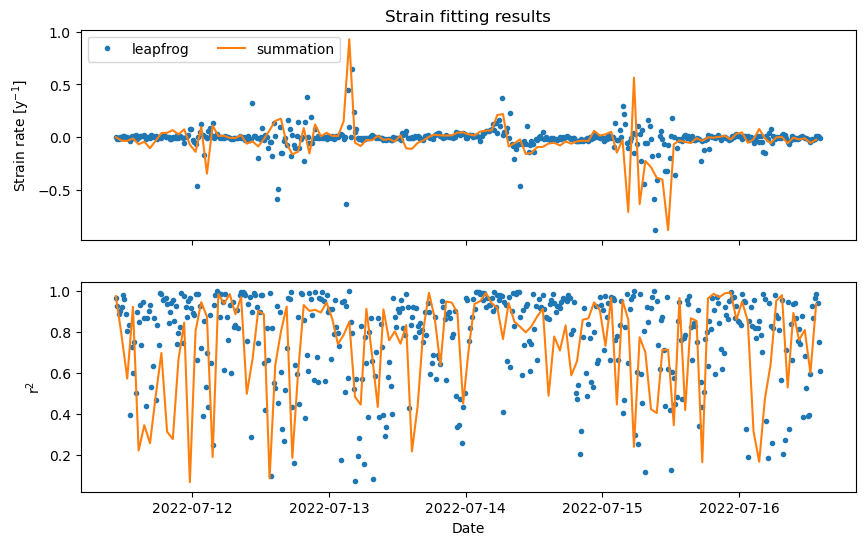

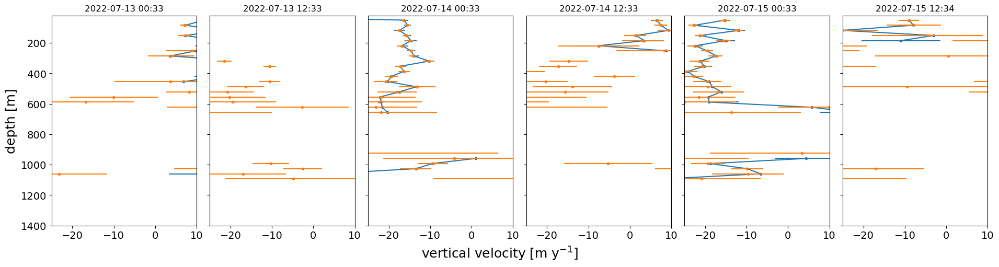

In [61]:
generate_strain_fit_drainage(to_plot,80,4,[-25,10]) # ~1 hour window

(<xarray.DataArray (time: 498, profile_range: 41)>
 array([[27.5213582 ,  9.9893605 ,  9.67009026, ...,         nan,
                 nan,         nan],
        [49.6537695 , 17.72185663, 17.30976432, ...,         nan,
                 nan,         nan],
        [22.70145735, 34.23217312, 37.40388567, ...,         nan,
                 nan,         nan],
        ...,
        [54.36313929,  7.55193107,  7.70490507, ...,         nan,
                 nan,         nan],
        [40.70560412,  4.1835038 ,  2.83285442, ...,         nan,
                 nan,         nan],
        [50.31316852, -0.60123696, -3.56065494, ...,         nan,
                 nan,         nan]])
 Coordinates:
   * time           (time) datetime64[ns] 2022-07-11T10:18:51 ... 2022-07-16T1...
   * profile_range  (profile_range) float64 16.82 50.47 ... 1.329e+03 1.363e+03,
 <xarray.DataArray (time: 498, profile_range: 41)>
 array([[ 6.06880156,  0.54914128,  0.5436486 , ...,         nan,
                 nan,        

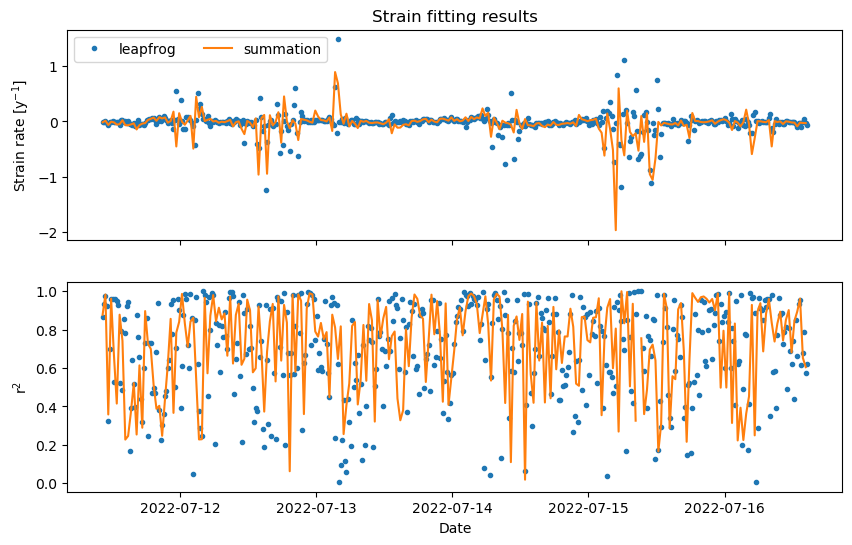

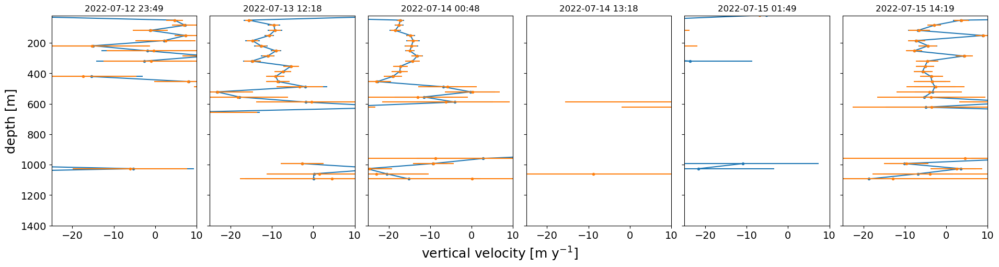

In [62]:
generate_strain_fit_drainage(to_plot,80,2,[-25,10]) # ~30 minute window

## A14

In [63]:
to_plot  = custom_stacked_profile_series(ds_104.chirp.isel(attenuator_setting_pair=0,time=range(4400,4900)),2,3e8,4e8)


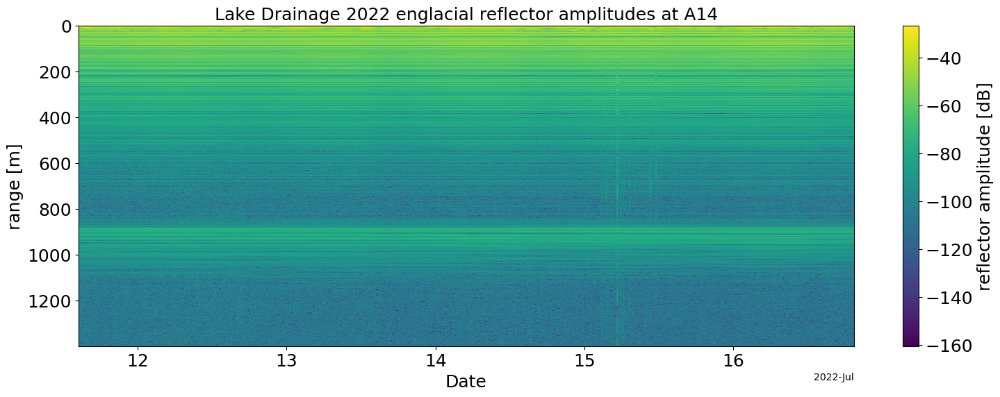

In [64]:
plot_profile(to_plot,'A14','Lake Drainage 2022')

(<xarray.DataArray (time: 468, profile_range: 41)>
 array([[         nan,  -3.66072051,  -4.20865817, ...,          nan,
                  nan,          nan],
        [         nan,  -4.28986489,  -4.55345762, ...,          nan,
                  nan,          nan],
        [         nan,  -5.34139675,  -5.23580854, ...,          nan,
                  nan,          nan],
        ...,
        [         nan,  -7.57201619,  -8.31159001, ...,          nan,
                  nan,          nan],
        [         nan,  -8.01602532,  -8.95808002, ...,          nan,
                  nan,          nan],
        [         nan,  -9.49921451, -10.56237655, ...,          nan,
                  nan,          nan]])
 Coordinates:
   * time           (time) datetime64[ns] 2022-07-11T18:34:11.500000 ... 2022-...
   * profile_range  (profile_range) float64 16.82 50.47 ... 1.329e+03 1.363e+03,
 <xarray.DataArray (time: 468, profile_range: 41)>
 array([[       nan, 0.27926914, 0.20275141, ...,        na

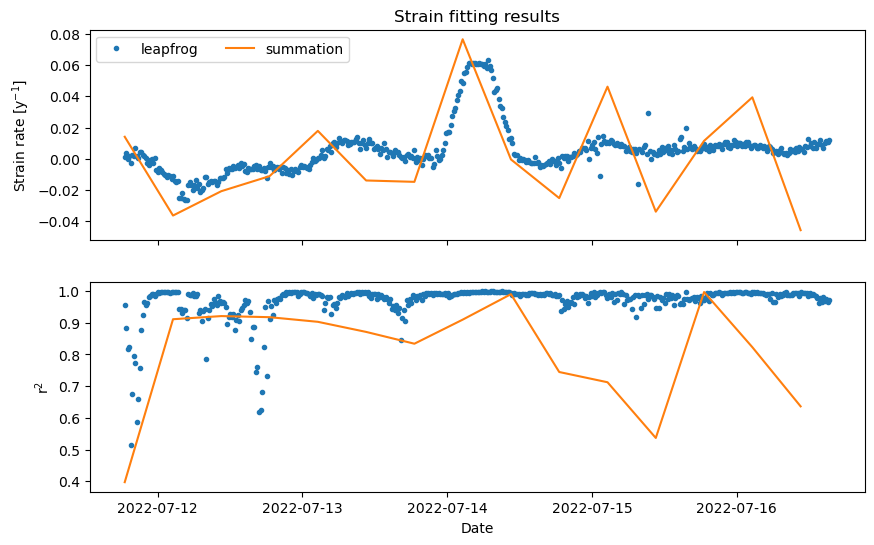

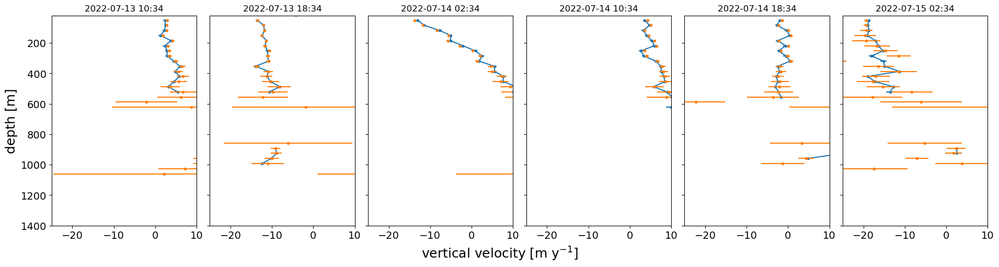

In [65]:
generate_strain_fit_drainage(to_plot,80,32,[-25,10]) # ~8 hour window

(<xarray.DataArray (time: 484, profile_range: 41)>
 array([[         nan,   0.62788831,  -0.81836193, ...,          nan,
                  nan,          nan],
        [         nan,   1.52883263,   0.30612417, ...,          nan,
                  nan,          nan],
        [         nan,   0.41505964,  -0.32997258, ...,          nan,
                  nan,          nan],
        ...,
        [         nan, -20.59815926, -22.70697484, ...,          nan,
                  nan,          nan],
        [         nan, -18.96866581, -21.32989783, ...,          nan,
                  nan,          nan],
        [         nan, -18.96312597, -21.25280227, ...,          nan,
                  nan,          nan]])
 Coordinates:
   * time           (time) datetime64[ns] 2022-07-11T16:34:06 ... 2022-07-16T1...
   * profile_range  (profile_range) float64 16.82 50.47 ... 1.329e+03 1.363e+03,
 <xarray.DataArray (time: 484, profile_range: 41)>
 array([[       nan, 0.6210998 , 0.52372015, ...,        na

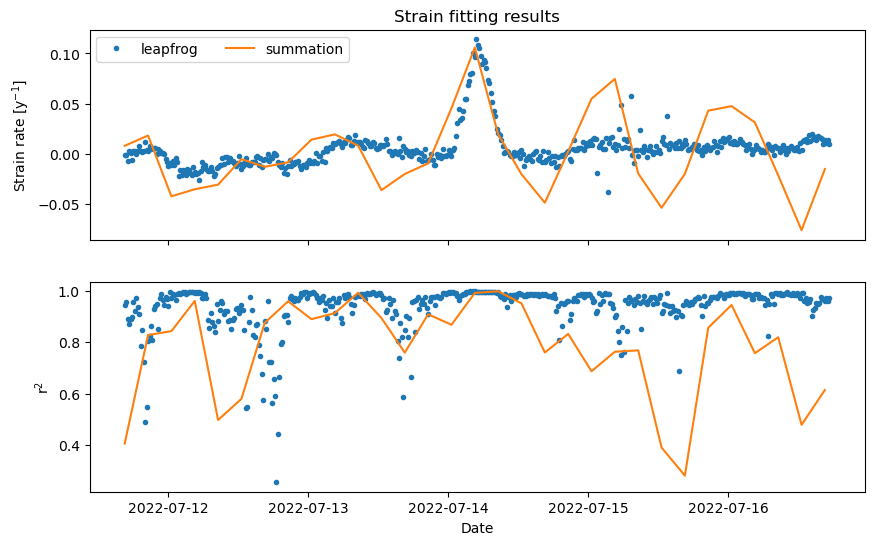

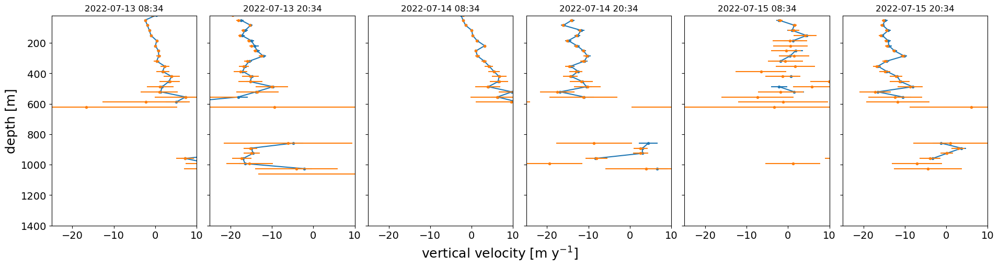

In [66]:
generate_strain_fit_drainage(to_plot,80,16,[-25,10]) # ~4 hour window

(<xarray.DataArray (time: 492, profile_range: 41)>
 array([[         nan,  -1.89727284,  -4.58898448, ...,          nan,
                  nan,          nan],
        [         nan,  -3.93893378,  -5.62767678, ...,          nan,
                  nan,          nan],
        [         nan,  -1.43063489,  -2.23714115, ...,          nan,
                  nan,          nan],
        ...,
        [         nan, -18.38936958, -21.27855929, ...,          nan,
                  nan,          nan],
        [         nan, -15.00760415, -18.04647174, ...,          nan,
                  nan,          nan],
        [         nan, -16.73826594, -19.30257338, ...,          nan,
                  nan,          nan]])
 Coordinates:
   * time           (time) datetime64[ns] 2022-07-11T15:34:07 ... 2022-07-16T1...
   * profile_range  (profile_range) float64 16.82 50.47 ... 1.329e+03 1.363e+03,
 <xarray.DataArray (time: 492, profile_range: 41)>
 array([[       nan, 0.97031922, 0.9188036 , ...,        na

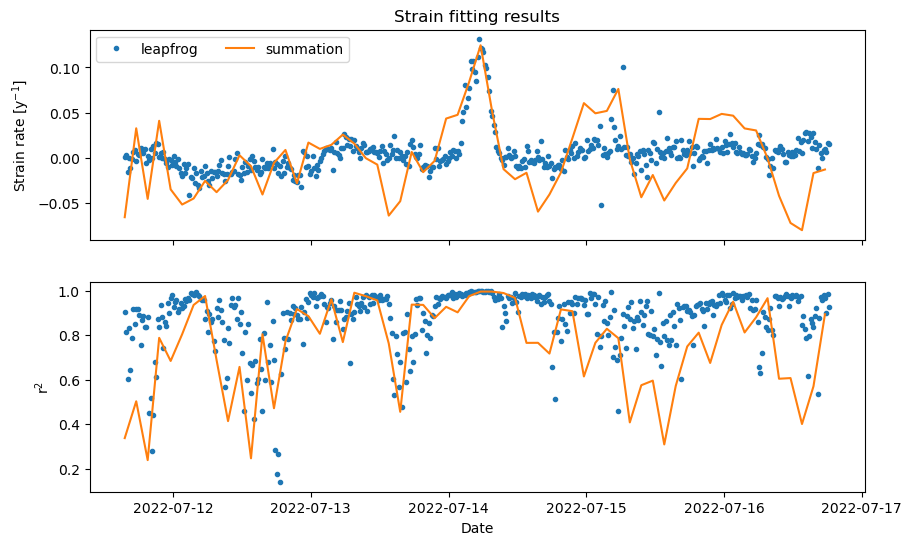

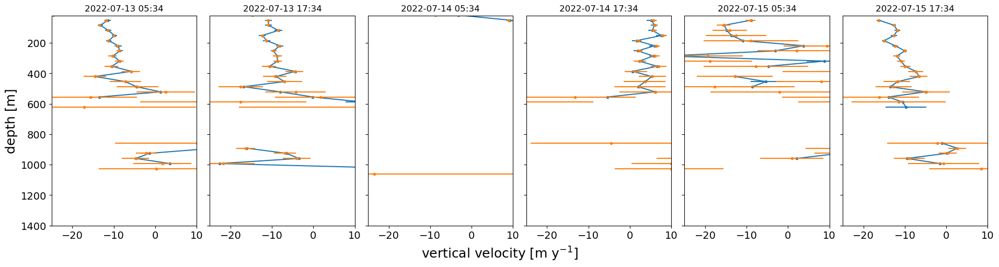

In [67]:
generate_strain_fit_drainage(to_plot,80,8,[-25,10]) # ~2 hour window

(<xarray.DataArray (time: 496, profile_range: 41)>
 array([[ 28.5962727 ,   3.62856737,  -1.59693328, ...,          nan,
                  nan,          nan],
        [ 40.9465329 ,   7.51596678,   3.85515161, ...,          nan,
                  nan,          nan],
        [ 46.61130183,  -5.10388204,  -6.63246901, ...,          nan,
                  nan,          nan],
        ...,
        [         nan, -13.08823596, -17.58944077, ...,          nan,
                  nan,          nan],
        [         nan, -10.35315144, -15.2787848 , ...,          nan,
                  nan,          nan],
        [         nan, -13.21313976, -16.84415589, ...,          nan,
                  nan,          nan]])
 Coordinates:
   * time           (time) datetime64[ns] 2022-07-11T15:04:06.500000 ... 2022-...
   * profile_range  (profile_range) float64 16.82 50.47 ... 1.329e+03 1.363e+03,
 <xarray.DataArray (time: 496, profile_range: 41)>
 array([[8.72638248, 1.42089583, 1.36443327, ...,        na

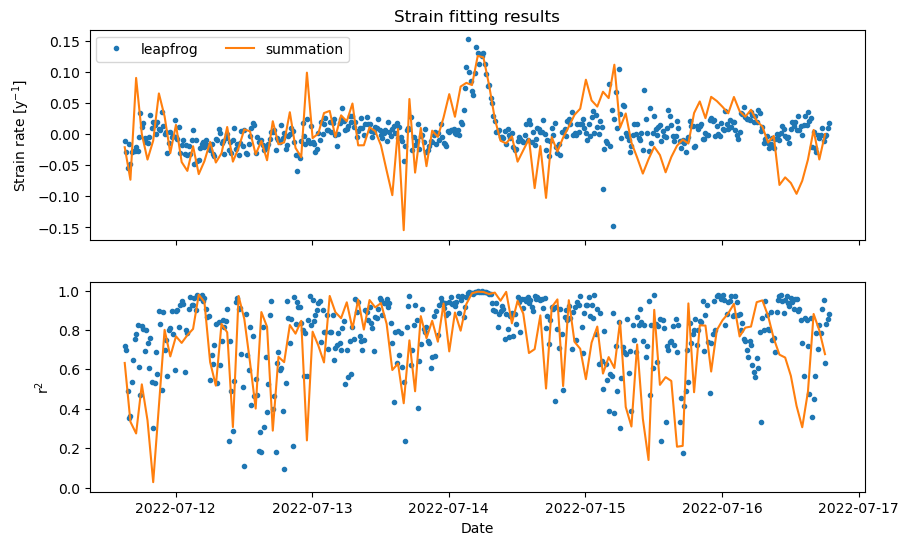

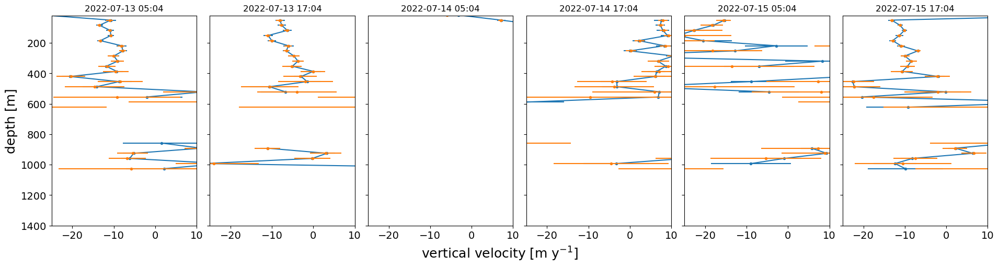

In [68]:
generate_strain_fit_drainage(to_plot,80,4,[-25,10]) # ~1 hour window

(<xarray.DataArray (time: 498, profile_range: 41)>
 array([[ 2.21170797e+01,  7.98014054e+00,  1.81077759e+00, ...,
                     nan,             nan,             nan],
        [ 4.22298792e+01,  1.17829807e+01,  4.35136481e+00, ...,
                     nan,             nan,             nan],
        [ 5.26520442e+01, -2.74415323e-02, -4.55775501e+00, ...,
                     nan,             nan,             nan],
        ...,
        [ 2.10755308e+01, -1.42720683e+01, -1.95410944e+01, ...,
                     nan,             nan,             nan],
        [ 1.04676957e+01, -1.26619654e+01, -1.57404944e+01, ...,
                     nan,             nan,             nan],
        [-9.80915161e-01, -1.22297906e+01, -1.41932726e+01, ...,
                     nan,             nan,             nan]])
 Coordinates:
   * time           (time) datetime64[ns] 2022-07-11T14:49:06 ... 2022-07-16T1...
   * profile_range  (profile_range) float64 16.82 50.47 ... 1.329e+03 1.363e+03,
 <

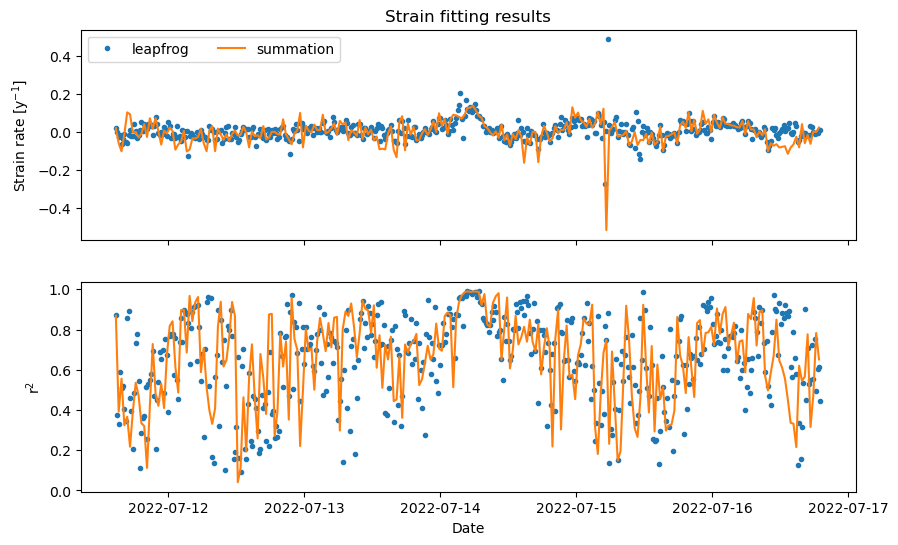

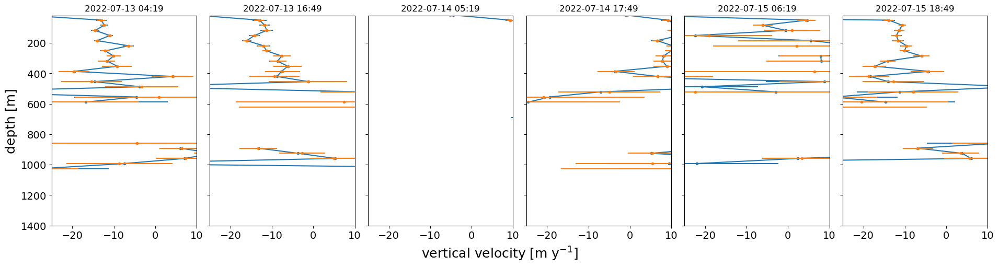

In [69]:
generate_strain_fit_drainage(to_plot,80,2,[-25,10]) # ~30 minute window